# Modeling and Simulation in Python

Chapter 12

Copyright 2017 Allen Downey

License: [Creative Commons Attribution 4.0 International](https://creativecommons.org/licenses/by/4.0)


In [2]:
# Configure Jupyter so figures appear in the notebook
%matplotlib inline

# Configure Jupyter to display the assigned value after an assignment
%config InteractiveShell.ast_node_interactivity='last_expr_or_assign'

# import functions from the modsim.py module
from modsim import *

### Code

Here's the code from the previous notebook that we'll need.

In [3]:
def make_system(beta, gamma):
    """Make a system object for the SIR model.
    
    beta: contact rate in days
    gamma: recovery rate in days
    
    returns: System object
    """
    init = State(S=89, I=1, R=0)
    init /= sum(init)

    t0 = 0
    t_end = 7 * 14

    return System(init=init, t0=t0, t_end=t_end,
                  beta=beta, gamma=gamma)

In [4]:
def update_func(state, t, system):
    """Update the SIR model.
    
    state: State with variables S, I, R
    t: time step
    system: System with beta and gamma
    
    returns: State object
    """
    s, i, r = state

    infected = system.beta * i * s    
    recovered = system.gamma * i
    
    s -= infected
    i += infected - recovered
    r += recovered
    
    return State(S=s, I=i, R=r)

In [5]:
def run_simulation(system, update_func):
    """Runs a simulation of the system.
        
    system: System object
    update_func: function that updates state
    
    returns: TimeFrame
    """
    frame = TimeFrame(columns=system.init.index)
    frame.row[system.t0] = system.init
    
    for t in linrange(system.t0, system.t_end):
        print(frame)
        frame.row[t+1] = update_func(frame.row[t], t, system)
    
    return frame

### Metrics

Given the results, we can compute metrics that quantify whatever we are interested in, like the total number of sick students, for example.

In [6]:
def calc_total_infected(results):
    """Fraction of population infected during the simulation.
    
    results: DataFrame with columns S, I, R
    
    returns: fraction of population
    """
    
    return get_first_value(results.S) - get_last_value(results.S)

Here's an example.|

In [7]:
beta = 0.333
gamma = 0.25
system = make_system(beta, gamma)

results = run_simulation(system, update_func)
print(beta, gamma, calc_total_infected(results))

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
2  0.981296  0.012929  0.005776
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
2  0.981296  0.012929  0.005776
3  0.977071  0.013921  0.009008
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
2  0.981296  0.012929  0.005776
3  0.977071  0.013921  0.009008
4  0.972541  0.014970  0.012488
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
2  0.981296  0.012929  0.005776
3  0.977071  0.013921  0.009008
4  0.972541  0.014970  0.012488
5  0.967693  0.016076  0.016231
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985230  0.011992  0.002778
2  0.981296  0.012929  0.005776
3  0.977071  0.013

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985230  0.011992  0.002778
2   0.981296  0.012929  0.005776
3   0.977071  0.013921  0.009008
4   0.972541  0.014970  0.012488
5   0.967693  0.016076  0.016231
6   0.962513  0.017237  0.020250
7   0.956988  0.018453  0.024559
8   0.951108  0.019720  0.029172
9   0.944862  0.021036  0.034102
10  0.938243  0.022396  0.039361
11  0.931246  0.023794  0.044960
12  0.923867  0.025224  0.050909
13  0.916107  0.026678  0.057215
14  0.907969  0.028147  0.063884
15  0.899458  0.029621  0.070921
16  0.890586  0.031087  0.078326
17  0.881367  0.032535  0.086098
18  0.871818  0.033950  0.094232
19  0.861962  0.035319  0.102719
20  0.851824  0.036627  0.111549
21  0.841435  0.037860  0.120706
22  0.830827  0.039003  0.130171
23  0.820036  0.040043  0.139921
24  0.809101  0.040967  0.149932
25  0.798063  0.041763  0.160174
26  0.786965  0.042421  0.170614
27  0.775848  0.042932  0.181220
28  0.764756  0.043291  0.191953
29  0.7537

**Exercise:** Write functions that take a `TimeFrame` object as a parameter and compute the other metrics mentioned in the book:

1.  The fraction of students who are sick at the peak of the outbreak.

2.  The day the outbreak peaks.

3.  The fraction of students who are sick at the end of the semester.

Note: Not all of these functions require the `System` object, but when you write a set of related functons, it is often convenient if they all take the same parameters.

Hint:  If you have a `TimeSeries` called `I`, you can compute the largest value of the series like this:

    I.max()

And the index of the largest value like this:

    I.idxmax()

You can read about these functions in the `Series` [documentation](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.html).

In [8]:
# Solution goes here
def calc_frac_peak(frame):
    peak = frame.I.max()
    return peak

calc_frac_peak(results)

0.043536202687592354

In [9]:
# Solution goes here
def calc_peak_day(frame):
    day = frame.I.idxmax()
    print(type(frame))
    return day

calc_peak_day(results)

<class 'modsim.TimeFrame'>


30

In [14]:
# Solution goes here
def calc_peak_day(frame):
    return get_last_value(frame.I)

calc_peak_day(results)

0.0006741943156034474

### What if?

We can use this model to evaluate "what if" scenarios.  For example, this function models the effect of immunization by moving some fraction of the population from S to R before the simulation starts.

In [15]:
def add_immunization(system, fraction):
    """Immunize a fraction of the population.
    
    Moves the given fraction from S to R.
    
    system: System object
    fraction: number from 0 to 1
    """
    system.init.S -= fraction
    system.init.R += fraction

Let's start again with the system we used in the previous sections.

In [16]:
tc = 3      # time between contacts in days 
tr = 4      # recovery time in days

beta = 1 / tc      # contact rate in per day
gamma = 1 / tr     # recovery rate in per day

system = make_system(beta, gamma)

,values
init,S 0.988889 I 0.011111 R 0.000000 dtyp...
t0,0
t_end,98
beta,0.333333
gamma,0.25


And run the model without immunization.

In [17]:
results = run_simulation(system, update_func)
calc_total_infected(results)

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
5  0.967658  0.016100  0.016241
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013

55  0.563196  0.016975  0.419829
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985226  0.011996  0.002778
2   0.981287  0.012936  0.005777
3   0.977055  0.013934  0.009011
4   0.972517  0.014988  0.012494
5   0.967658  0.016100  0.016241
6   0.962465  0.017268  0.020266
7   0.956925  0.018491  0.024584
8   0.951027  0.019767  0.029206
9   0.944761  0.021091  0.034148
10  0.938119  0.022460  0.039421
11  0.931095  0.023869  0.045036
12  0.923687  0.025310  0.051003
13  0.915895  0.026775  0.057330
14  0.907720  0.028256  0.064024
15  0.899171  0.029741  0.071088
16  0.890257  0.031220  0.078523
17  0.880992  0.032680  0.086328
18  0.871395  0.034106  0.094498
19  0.861489  0.035487  0.103025
20  0.851298  0.036805  0.111897
21  0.840854  0.038048  0.121098
22  0.830190  0.039200  0.130610
23  0.819342  0.040248  0.140410
24  0.808349  0.041179  0.150472
25  0.797254  0.041979  0.160767
26  0.786098  0.042641  0.171262
27  0.774925  0.043154  0.181922
28  0.7637

[93 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985226  0.011996  0.002778
2   0.981287  0.012936  0.005777
3   0.977055  0.013934  0.009011
4   0.972517  0.014988  0.012494
5   0.967658  0.016100  0.016241
6   0.962465  0.017268  0.020266
7   0.956925  0.018491  0.024584
8   0.951027  0.019767  0.029206
9   0.944761  0.021091  0.034148
10  0.938119  0.022460  0.039421
11  0.931095  0.023869  0.045036
12  0.923687  0.025310  0.051003
13  0.915895  0.026775  0.057330
14  0.907720  0.028256  0.064024
15  0.899171  0.029741  0.071088
16  0.890257  0.031220  0.078523
17  0.880992  0.032680  0.086328
18  0.871395  0.034106  0.094498
19  0.861489  0.035487  0.103025
20  0.851298  0.036805  0.111897
21  0.840854  0.038048  0.121098
22  0.830190  0.039200  0.130610
23  0.819342  0.040248  0.140410
24  0.808349  0.041179  0.150472
25  0.797254  0.041979  0.160767
26  0.786098  0.042641  0.171262
27  0.774925  0.043154  0.181922
28  0.763778  0.04351

0.468320811028781

Now with 10% immunization.

In [18]:
system2 = make_system(beta, gamma)
add_immunization(system2, 0.1)
results2 = run_simulation(system2, update_func)
calc_total_infected(results2)

          S         I    R
0  0.888889  0.011111  0.1
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
2  0.882165  0.012151  0.105684
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
2  0.882165  0.012151  0.105684
3  0.878592  0.012686  0.108722
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
2  0.882165  0.012151  0.105684
3  0.878592  0.012686  0.108722
4  0.874876  0.013230  0.111893
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
2  0.882165  0.012151  0.105684
3  0.878592  0.012686  0.108722
4  0.874876  0.013230  0.111893
5  0.871018  0.013781  0.115201
          S         I         R
0  0.888889  0.011111  0.100000
1  0.885597  0.011626  0.102778
2  0.882165  0.012151  0.105684
3  0.878592  0.012

           S         I         R
0   0.888889  0.011111  0.100000
1   0.885597  0.011626  0.102778
2   0.882165  0.012151  0.105684
3   0.878592  0.012686  0.108722
4   0.874876  0.013230  0.111893
5   0.871018  0.013781  0.115201
6   0.867017  0.014337  0.118646
7   0.862874  0.014896  0.122230
8   0.858589  0.015456  0.125954
9   0.854166  0.016016  0.129818
10  0.849606  0.016572  0.133822
11  0.844913  0.017122  0.137965
12  0.840090  0.017664  0.142246
13  0.835144  0.018194  0.146662
14  0.830079  0.018711  0.151210
15  0.824902  0.019210  0.155888
16  0.819620  0.019690  0.160691
17  0.814240  0.020147  0.165613
18  0.808772  0.020578  0.170650
19  0.803225  0.020981  0.175794
20  0.797607  0.021353  0.181040
21  0.791930  0.021692  0.186378
22  0.786204  0.021995  0.191801
23  0.780439  0.022261  0.197300
24  0.774648  0.022487  0.202865
25  0.768842  0.022672  0.208487
26  0.763031  0.022814  0.214155
27  0.757229  0.022913  0.219858
28  0.751445  0.022968  0.225586
29  0.7456

0.30650802853979753

10% immunization leads to a drop in infections of 16 percentage points.

Here's what the time series looks like for S, with and without immunization.

Saving figure to file figs/chap05-fig02.pdf


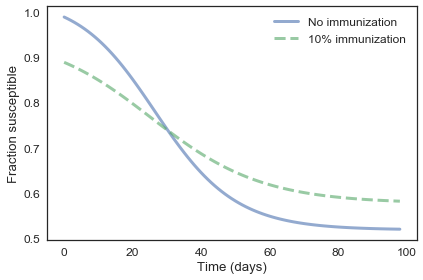

In [19]:
plot(results.S, '-', label='No immunization')
plot(results2.S, '--', label='10% immunization')

decorate(xlabel='Time (days)',
         ylabel='Fraction susceptible')

savefig('figs/chap05-fig02.pdf')

Now we can sweep through a range of values for the fraction of the population who are immunized.

In [20]:
immunize_array = linspace(0, 1, 11)
for fraction in immunize_array:
    system = make_system(beta, gamma)
    add_immunization(system, fraction)
    results = run_simulation(system, update_func)
    print(fraction, calc_total_infected(results))

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
5  0.967658  0.016100  0.016241
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985226  0.011996  0.002778
2   0.981287  0.012936  0.005777
3   0.977055  0.013934  0.009011
4   0.972517  0.014988  0.012494
5   0.967658  0.016100  0.016241
6   0.962465  0.017268  0.020266
7   0.956925  0.018491  0.024584
8   0.951027  0.019767  0.029206
9   0.944761  0.021091  0.034148
10  0.938119  0.022460  0.039421
11  0.931095  0.023869  0.045036
12  0.923687  0.025310  0.051003
13  0.915895  0.026775  0.057330
14  0.907720  0.028256  0.064024
15  0.899171  0.029741  0.071088
16  0.890257  0.031220  0.078523
17  0.880992  0.032680  0.086328
18  0.871395  0.034106  0.094498
19  0.861489  0.035487  0.103025
20  0.851298  0.036805  0.111897
21  0.840854  0.038048  0.121098
22  0.830190  0.039200  0.130610
23  0.819342  0.040248  0.140410
24  0.808349  0.041179  0.150472
25  0.797254  0.041979  0.160767
26  0.786098  0.042641  0.171262
27  0.774925  0.043154  0.181922
28  0.763778  0.043512  0.192710
29  0.7527

38  0.696937  0.021211  0.281852
           S         I         R
0   0.888889  0.011111  0.100000
1   0.885597  0.011626  0.102778
2   0.882165  0.012151  0.105684
3   0.878592  0.012686  0.108722
4   0.874876  0.013230  0.111893
5   0.871018  0.013781  0.115201
6   0.867017  0.014337  0.118646
7   0.862874  0.014896  0.122230
8   0.858589  0.015456  0.125954
9   0.854166  0.016016  0.129818
10  0.849606  0.016572  0.133822
11  0.844913  0.017122  0.137965
12  0.840090  0.017664  0.142246
13  0.835144  0.018194  0.146662
14  0.830079  0.018711  0.151210
15  0.824902  0.019210  0.155888
16  0.819620  0.019690  0.160691
17  0.814240  0.020147  0.165613
18  0.808772  0.020578  0.170650
19  0.803225  0.020981  0.175794
20  0.797607  0.021353  0.181040
21  0.791930  0.021692  0.186378
22  0.786204  0.021995  0.191801
23  0.780439  0.022261  0.197300
24  0.774648  0.022487  0.202865
25  0.768842  0.022672  0.208487
26  0.763031  0.022814  0.214155
27  0.757229  0.022913  0.219858
28  0.7514

           S         I         R
0   0.788889  0.011111  0.200000
1   0.785967  0.011255  0.202778
2   0.783018  0.011390  0.205592
3   0.780045  0.011515  0.208439
4   0.777051  0.011631  0.211318
5   0.774039  0.011736  0.214226
6   0.771011  0.011830  0.217160
7   0.767970  0.011913  0.220117
8   0.764921  0.011984  0.223095
9   0.761865  0.012043  0.226091
10  0.758807  0.012091  0.229102
11  0.755749  0.012127  0.232125
12  0.752694  0.012150  0.235156
13  0.749645  0.012161  0.238194
14  0.746607  0.012159  0.241234
15  0.743581  0.012146  0.244274
16  0.740570  0.012120  0.247310
17  0.737578  0.012081  0.250340
           S         I         R
0   0.788889  0.011111  0.200000
1   0.785967  0.011255  0.202778
2   0.783018  0.011390  0.205592
3   0.780045  0.011515  0.208439
4   0.777051  0.011631  0.211318
5   0.774039  0.011736  0.214226
6   0.771011  0.011830  0.217160
7   0.767970  0.011913  0.220117
8   0.764921  0.011984  0.223095
9   0.761865  0.012043  0.226091
10  0.7588

           S         I         R
0   0.688889  0.011111  0.300000
1   0.686337  0.010885  0.302778
2   0.683847  0.010654  0.305499
3   0.681419  0.010419  0.308162
4   0.679052  0.010181  0.310767
5   0.676748  0.009940  0.313312
6   0.674506  0.009697  0.315797
7   0.672325  0.009453  0.318222
8   0.670207  0.009208  0.320585
9   0.668150  0.008964  0.322887
10  0.666153  0.008719  0.325128
11  0.664217  0.008475  0.327308
12  0.662341  0.008233  0.329426
13  0.660523  0.007992  0.331485
14  0.658763  0.007754  0.333483
15  0.657061  0.007518  0.335421
16  0.655414  0.007285  0.337301
17  0.653822  0.007056  0.339122
18  0.652285  0.006829  0.340886
19  0.650800  0.006607  0.342593
20  0.649367  0.006388  0.344245
21  0.647984  0.006174  0.345842
           S         I         R
0   0.688889  0.011111  0.300000
1   0.686337  0.010885  0.302778
2   0.683847  0.010654  0.305499
3   0.681419  0.010419  0.308162
4   0.679052  0.010181  0.310767
5   0.676748  0.009940  0.313312
6   0.6745

5  0.579172  0.008370  0.412458
          S         I         R
0  0.588889  0.011111  0.400000
1  0.586708  0.010514  0.402778
2  0.584652  0.009942  0.405406
3  0.582714  0.009394  0.407892
4  0.580889  0.008870  0.410240
5  0.579172  0.008370  0.412458
6  0.577556  0.007894  0.414551
          S         I         R
0  0.588889  0.011111  0.400000
1  0.586708  0.010514  0.402778
2  0.584652  0.009942  0.405406
3  0.582714  0.009394  0.407892
4  0.580889  0.008870  0.410240
5  0.579172  0.008370  0.412458
6  0.577556  0.007894  0.414551
7  0.576036  0.007440  0.416524
          S         I         R
0  0.588889  0.011111  0.400000
1  0.586708  0.010514  0.402778
2  0.584652  0.009942  0.405406
3  0.582714  0.009394  0.407892
4  0.580889  0.008870  0.410240
5  0.579172  0.008370  0.412458
6  0.577556  0.007894  0.414551
7  0.576036  0.007440  0.416524
8  0.574608  0.007008  0.418384
          S         I         R
0  0.588889  0.011111  0.400000
1  0.586708  0.010514  0.402778
2  0.584

[68 rows x 3 columns]
           S         I         R
0   0.488889  0.011111  0.500000
1   0.487078  0.010144  0.502778
2   0.485431  0.009255  0.505314
3   0.483934  0.008439  0.507628
4   0.482572  0.007690  0.509737
5   0.481335  0.007005  0.511660
6   0.480211  0.006378  0.513411
7   0.479191  0.005804  0.515005
8   0.478264  0.005280  0.516456
9   0.477422  0.004802  0.517776
10  0.476658  0.004366  0.518977
11  0.475964  0.003968  0.520068
12  0.475334  0.003605  0.521060
13  0.474763  0.003275  0.521962
14  0.474245  0.002975  0.522780
15  0.473775  0.002701  0.523524
16  0.473348  0.002453  0.524199
17  0.472961  0.002226  0.524813
18  0.472610  0.002021  0.525369
19  0.472292  0.001834  0.525874
20  0.472003  0.001664  0.526333
21  0.471741  0.001510  0.526749
22  0.471504  0.001370  0.527126
23  0.471288  0.001243  0.527469
24  0.471093  0.001127  0.527780
25  0.470916  0.001022  0.528061
26  0.470756  0.000927  0.528317
27  0.470610  0.000841  0.528549
28  0.470478  0.00076

           S         I         R
0   0.388889  0.011111  0.600000
1   0.387449  0.009774  0.602778
2   0.386186  0.008593  0.605221
3   0.385080  0.007550  0.607369
4   0.384111  0.006632  0.609257
5   0.383262  0.005823  0.610915
6   0.382518  0.005111  0.612371
7   0.381866  0.004485  0.613649
8   0.381295  0.003935  0.614770
9   0.380795  0.003451  0.615754
10  0.380357  0.003026  0.616616
11  0.379973  0.002654  0.617373
12  0.379637  0.002326  0.618036
13  0.379343  0.002039  0.618618
14  0.379085  0.001787  0.619128
15  0.378859  0.001566  0.619575
16  0.378661  0.001372  0.619966
17  0.378488  0.001203  0.620309
18  0.378337  0.001054  0.620610
19  0.378204  0.000923  0.620873
20  0.378087  0.000809  0.621104
21  0.377985  0.000708  0.621306
22  0.377896  0.000621  0.621483
23  0.377818  0.000544  0.621638
24  0.377749  0.000476  0.621774
25  0.377689  0.000417  0.621893
26  0.377637  0.000365  0.621998
27  0.377591  0.000320  0.622089
28  0.377551  0.000280  0.622169
29  0.3775

9  0.283532  0.002448  0.714020
           S         I         R
0   0.288889  0.011111  0.700000
1   0.287819  0.009403  0.702778
2   0.286917  0.007955  0.705129
3   0.286156  0.006727  0.707117
4   0.285514  0.005687  0.708799
5   0.284973  0.004806  0.710221
6   0.284517  0.004061  0.711422
7   0.284131  0.003431  0.712437
8   0.283807  0.002898  0.713295
9   0.283532  0.002448  0.714020
10  0.283301  0.002067  0.714632
           S         I         R
0   0.288889  0.011111  0.700000
1   0.287819  0.009403  0.702778
2   0.286917  0.007955  0.705129
3   0.286156  0.006727  0.707117
4   0.285514  0.005687  0.708799
5   0.284973  0.004806  0.710221
6   0.284517  0.004061  0.711422
7   0.284131  0.003431  0.712437
8   0.283807  0.002898  0.713295
9   0.283532  0.002448  0.714020
10  0.283301  0.002067  0.714632
11  0.283106  0.001746  0.715149
           S         I         R
0   0.288889  0.011111  0.700000
1   0.287819  0.009403  0.702778
2   0.286917  0.007955  0.705129
3   0.28615

27  0.185206  0.000040  0.814754
           S         I         R
0   0.188889  0.011111  0.800000
1   0.188189  0.009033  0.802778
2   0.187623  0.007341  0.805036
3   0.187164  0.005965  0.806871
4   0.186791  0.004846  0.808363
5   0.186490  0.003936  0.809574
6   0.186245  0.003197  0.810558
7   0.186046  0.002596  0.811357
8   0.185885  0.002108  0.812006
9   0.185755  0.001712  0.812533
10  0.185649  0.001390  0.812961
11  0.185563  0.001128  0.813309
12  0.185493  0.000916  0.813591
13  0.185436  0.000744  0.813820
14  0.185390  0.000604  0.814006
15  0.185353  0.000490  0.814157
16  0.185323  0.000398  0.814279
17  0.185298  0.000323  0.814379
18  0.185278  0.000262  0.814459
19  0.185262  0.000213  0.814525
20  0.185249  0.000173  0.814578
21  0.185238  0.000140  0.814621
22  0.185230  0.000114  0.814656
23  0.185223  0.000092  0.814685
24  0.185217  0.000075  0.814708
25  0.185212  0.000061  0.814727
26  0.185209  0.000049  0.814742
27  0.185206  0.000040  0.814754
28  0.1852

40 -0.010950  9.190453e-08  1.010950
           S             I         R
0  -0.011111  1.111111e-02  1.000000
1  -0.011070  8.292181e-03  1.002778
2  -0.011039  6.188538e-03  1.004851
3  -0.011017  4.618631e-03  1.006398
4  -0.011000  3.447013e-03  1.007553
5  -0.010987  2.572621e-03  1.008414
6  -0.010978  1.920044e-03  1.009058
7  -0.010971  1.433007e-03  1.009538
8  -0.010965  1.069515e-03  1.009896
9  -0.010961  7.982271e-04  1.010163
10 -0.010958  5.957537e-04  1.010363
11 -0.010956  4.446391e-04  1.010512
12 -0.010955  3.318555e-04  1.010623
13 -0.010953  2.476798e-04  1.010706
14 -0.010953  1.848555e-04  1.010768
15 -0.010952  1.379668e-04  1.010814
16 -0.010951  1.029714e-04  1.010848
17 -0.010951  7.685267e-05  1.010874
18 -0.010951  5.735897e-05  1.010893
19 -0.010951  4.280985e-05  1.010908
20 -0.010950  3.195112e-05  1.010918
21 -0.010950  2.384672e-05  1.010926
22 -0.010950  1.779800e-05  1.010932
23 -0.010950  1.328353e-05  1.010937
24 -0.010950  9.914165e-06  1.010940
2

This function does the same thing and stores the results in a `Sweep` object.

In [21]:
def sweep_immunity(immunize_array):
    """Sweeps a range of values for immunity.
    
    immunize_array: array of fraction immunized
    
    returns: Sweep object
    """
    sweep = SweepSeries()
    
    for fraction in immunize_array:
        system = make_system(beta, gamma)
        add_immunization(system, fraction)
        results = run_simulation(system, update_func)
        sweep[fraction] = calc_total_infected(results)
        
    return sweep

Here's how we run it.

In [22]:
immunize_array = linspace(0, 1, 21)
infected_sweep = sweep_immunity(immunize_array)

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013934  0.009011
4  0.972517  0.014988  0.012494
5  0.967658  0.016100  0.016241
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985226  0.011996  0.002778
2  0.981287  0.012936  0.005777
3  0.977055  0.013

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985226  0.011996  0.002778
2   0.981287  0.012936  0.005777
3   0.977055  0.013934  0.009011
4   0.972517  0.014988  0.012494
5   0.967658  0.016100  0.016241
6   0.962465  0.017268  0.020266
7   0.956925  0.018491  0.024584
8   0.951027  0.019767  0.029206
9   0.944761  0.021091  0.034148
10  0.938119  0.022460  0.039421
11  0.931095  0.023869  0.045036
12  0.923687  0.025310  0.051003
13  0.915895  0.026775  0.057330
14  0.907720  0.028256  0.064024
15  0.899171  0.029741  0.071088
16  0.890257  0.031220  0.078523
17  0.880992  0.032680  0.086328
18  0.871395  0.034106  0.094498
19  0.861489  0.035487  0.103025
20  0.851298  0.036805  0.111897
21  0.840854  0.038048  0.121098
22  0.830190  0.039200  0.130610
23  0.819342  0.040248  0.140410
24  0.808349  0.041179  0.150472
25  0.797254  0.041979  0.160767
26  0.786098  0.042641  0.171262
27  0.774925  0.043154  0.181922
28  0.763778  0.043512  0.192710
29  0.7527

           S         I         R
0   0.938889  0.011111  0.050000
1   0.935412  0.011811  0.052778
2   0.931729  0.012541  0.055730
3   0.927834  0.013300  0.058866
4   0.923721  0.014089  0.062191
5   0.919383  0.014905  0.065713
6   0.914815  0.015746  0.069439
7   0.910013  0.016611  0.073376
8   0.904975  0.017497  0.077528
9   0.899696  0.018401  0.081903
10  0.894178  0.019319  0.086503
11  0.888420  0.020248  0.091333
12  0.882424  0.021182  0.096395
13  0.876193  0.022117  0.101690
14  0.869733  0.023047  0.107219
15  0.863052  0.023967  0.112981
16  0.856157  0.024870  0.118973
17  0.849059  0.025750  0.125190
18  0.841771  0.026601  0.131628
19  0.834308  0.027414  0.138278
20  0.826684  0.028185  0.145132
21  0.818917  0.028905  0.152178
22  0.811027  0.029569  0.159404
23  0.803033  0.030171  0.166796
24  0.794957  0.030704  0.174339
25  0.786821  0.031164  0.182015
26  0.778647  0.031547  0.189806
27  0.770459  0.031848  0.197693
28  0.762280  0.032065  0.205655
29  0.7541

           S         I         R
0   0.888889  0.011111  0.100000
1   0.885597  0.011626  0.102778
2   0.882165  0.012151  0.105684
3   0.878592  0.012686  0.108722
4   0.874876  0.013230  0.111893
5   0.871018  0.013781  0.115201
6   0.867017  0.014337  0.118646
7   0.862874  0.014896  0.122230
8   0.858589  0.015456  0.125954
9   0.854166  0.016016  0.129818
10  0.849606  0.016572  0.133822
11  0.844913  0.017122  0.137965
12  0.840090  0.017664  0.142246
13  0.835144  0.018194  0.146662
14  0.830079  0.018711  0.151210
15  0.824902  0.019210  0.155888
16  0.819620  0.019690  0.160691
17  0.814240  0.020147  0.165613
18  0.808772  0.020578  0.170650
19  0.803225  0.020981  0.175794
20  0.797607  0.021353  0.181040
21  0.791930  0.021692  0.186378
22  0.786204  0.021995  0.191801
23  0.780439  0.022261  0.197300
24  0.774648  0.022487  0.202865
25  0.768842  0.022672  0.208487
26  0.763031  0.022814  0.214155
27  0.757229  0.022913  0.219858
28  0.751445  0.022968  0.225586
29  0.7456

           S         I         R
0   0.838889  0.011111  0.150000
1   0.835782  0.011440  0.152778
2   0.832595  0.011767  0.155638
3   0.829329  0.012091  0.158580
4   0.825986  0.012411  0.161603
5   0.822569  0.012726  0.164705
6   0.819080  0.013033  0.167887
7   0.815521  0.013333  0.171145
8   0.811897  0.013625  0.174478
9   0.808210  0.013906  0.177885
10  0.804463  0.014176  0.181361
11  0.800662  0.014433  0.184905
12  0.796810  0.014677  0.188513
13  0.792912  0.014906  0.192182
14  0.788972  0.015119  0.195909
15  0.784996  0.015315  0.199689
16  0.780989  0.015494  0.203517
17  0.776955  0.015654  0.207391
18  0.772901  0.015795  0.211304
19  0.768832  0.015915  0.215253
20  0.764753  0.016015  0.219232
21  0.760671  0.016094  0.223236
22  0.756590  0.016151  0.227259
23  0.752517  0.016187  0.231297
24  0.748456  0.016200  0.235344
25  0.744415  0.016192  0.239394
26  0.740397  0.016162  0.243442
27  0.736408  0.016110  0.247482
28  0.732454  0.016037  0.251509
29  0.7285

29  0.704058  0.010786  0.285156
           S         I         R
0   0.788889  0.011111  0.200000
1   0.785967  0.011255  0.202778
2   0.783018  0.011390  0.205592
3   0.780045  0.011515  0.208439
4   0.777051  0.011631  0.211318
5   0.774039  0.011736  0.214226
6   0.771011  0.011830  0.217160
7   0.767970  0.011913  0.220117
8   0.764921  0.011984  0.223095
9   0.761865  0.012043  0.226091
10  0.758807  0.012091  0.229102
11  0.755749  0.012127  0.232125
12  0.752694  0.012150  0.235156
13  0.749645  0.012161  0.238194
14  0.746607  0.012159  0.241234
15  0.743581  0.012146  0.244274
16  0.740570  0.012120  0.247310
17  0.737578  0.012081  0.250340
18  0.734608  0.012031  0.253361
19  0.731662  0.011970  0.256368
20  0.728743  0.011897  0.259361
21  0.725853  0.011812  0.262335
22  0.722995  0.011717  0.265288
23  0.720171  0.011612  0.268217
24  0.717383  0.011496  0.271120
25  0.714634  0.011371  0.273994
26  0.711926  0.011237  0.276837
27  0.709259  0.011095  0.279646
28  0.7066

           S         I         R
0   0.688889  0.011111  0.300000
1   0.686337  0.010885  0.302778
2   0.683847  0.010654  0.305499
3   0.681419  0.010419  0.308162
4   0.679052  0.010181  0.310767
5   0.676748  0.009940  0.313312
6   0.674506  0.009697  0.315797
7   0.672325  0.009453  0.318222
8   0.670207  0.009208  0.320585
9   0.668150  0.008964  0.322887
10  0.666153  0.008719  0.325128
11  0.664217  0.008475  0.327308
12  0.662341  0.008233  0.329426
13  0.660523  0.007992  0.331485
14  0.658763  0.007754  0.333483
15  0.657061  0.007518  0.335421
16  0.655414  0.007285  0.337301
17  0.653822  0.007056  0.339122
18  0.652285  0.006829  0.340886
19  0.650800  0.006607  0.342593
20  0.649367  0.006388  0.344245
21  0.647984  0.006174  0.345842
22  0.646650  0.005964  0.347386
23  0.645365  0.005759  0.348877
24  0.644126  0.005558  0.350316
25  0.642932  0.005362  0.351706
26  0.641783  0.005170  0.353046
27  0.640677  0.004984  0.354339
28  0.639613  0.004802  0.355585
29  0.6385

[70 rows x 3 columns]
           S         I         R
0   0.638889  0.011111  0.350000
1   0.636523  0.010700  0.352778
2   0.634252  0.010295  0.355453
3   0.632076  0.009898  0.358026
4   0.629991  0.009509  0.360501
5   0.627994  0.009128  0.362878
6   0.626083  0.008757  0.365160
7   0.624255  0.008395  0.367349
8   0.622509  0.008043  0.369448
9   0.620839  0.007702  0.371459
10  0.619246  0.007370  0.373384
11  0.617724  0.007049  0.375227
12  0.616273  0.006738  0.376989
13  0.614889  0.006438  0.378674
14  0.613569  0.006148  0.380283
15  0.612312  0.005868  0.381820
16  0.611114  0.005599  0.383287
17  0.609974  0.005340  0.384687
18  0.608888  0.005090  0.386021
19  0.607855  0.004851  0.387294
20  0.606872  0.004621  0.388507
21  0.605937  0.004401  0.389662
22  0.605048  0.004189  0.390762
23  0.604204  0.003987  0.391810
24  0.603401  0.003793  0.392806
25  0.602638  0.003608  0.393755
26  0.601913  0.003431  0.394657
27  0.601225  0.003261  0.395514
28  0.600571  0.00309

[86 rows x 3 columns]
           S         I         R
0   0.588889  0.011111  0.400000
1   0.586708  0.010514  0.402778
2   0.584652  0.009942  0.405406
3   0.582714  0.009394  0.407892
4   0.580889  0.008870  0.410240
5   0.579172  0.008370  0.412458
6   0.577556  0.007894  0.414551
7   0.576036  0.007440  0.416524
8   0.574608  0.007008  0.418384
9   0.573265  0.006599  0.420136
10  0.572004  0.006210  0.421786
11  0.570820  0.005842  0.423338
12  0.569709  0.005493  0.424799
13  0.568666  0.005163  0.426172
14  0.567687  0.004851  0.427462
15  0.566769  0.004556  0.428675
16  0.565909  0.004277  0.429814
17  0.565102  0.004015  0.430883
18  0.564345  0.003768  0.431887
19  0.563637  0.003534  0.432829
20  0.562973  0.003315  0.433713
21  0.562350  0.003108  0.434541
22  0.561768  0.002914  0.435318
23  0.561222  0.002731  0.436047
24  0.560711  0.002559  0.436730
25  0.560233  0.002398  0.437369
26  0.559785  0.002246  0.437969
27  0.559366  0.002104  0.438530
28  0.558974  0.00197

42  0.513610  0.000393  0.485997
           S         I         R
0   0.538889  0.011111  0.450000
1   0.536893  0.010329  0.452778
2   0.535044  0.009595  0.455360
3   0.533333  0.008908  0.457759
4   0.531749  0.008265  0.459986
5   0.530285  0.007663  0.462052
6   0.528930  0.007102  0.463968
7   0.527678  0.006579  0.465743
8   0.526521  0.006091  0.467388
9   0.525452  0.005637  0.468911
10  0.524464  0.005215  0.470320
11  0.523552  0.004823  0.471624
12  0.522711  0.004459  0.472830
13  0.521934  0.004121  0.473945
14  0.521217  0.003808  0.474975
15  0.520555  0.003518  0.475927
16  0.519945  0.003249  0.476807
17  0.519382  0.003000  0.477619
18  0.518862  0.002769  0.478369
19  0.518383  0.002556  0.479061
20  0.517942  0.002358  0.479700
21  0.517535  0.002176  0.480289
22  0.517159  0.002007  0.480833
23  0.516813  0.001852  0.481335
24  0.516494  0.001708  0.481798
25  0.516200  0.001575  0.482225
26  0.515929  0.001452  0.482619
27  0.515680  0.001339  0.482982
28  0.5154

          S         I    R
0  0.488889  0.011111  0.5
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
2  0.485431  0.009255  0.505314
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
2  0.485431  0.009255  0.505314
3  0.483934  0.008439  0.507628
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
2  0.485431  0.009255  0.505314
3  0.483934  0.008439  0.507628
4  0.482572  0.007690  0.509737
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
2  0.485431  0.009255  0.505314
3  0.483934  0.008439  0.507628
4  0.482572  0.007690  0.509737
5  0.481335  0.007005  0.511660
          S         I         R
0  0.488889  0.011111  0.500000
1  0.487078  0.010144  0.502778
2  0.485431  0.009255  0.505314
3  0.483934  0.008

[69 rows x 3 columns]
           S         I         R
0   0.438889  0.011111  0.550000
1   0.437263  0.009959  0.552778
2   0.435812  0.008921  0.555267
3   0.434516  0.007986  0.557498
4   0.433359  0.007147  0.559494
5   0.432327  0.006392  0.561281
6   0.431406  0.005715  0.562879
7   0.430584  0.005108  0.564308
8   0.429851  0.004565  0.565585
9   0.429197  0.004077  0.566726
10  0.428613  0.003641  0.567745
11  0.428093  0.003251  0.568656
12  0.427629  0.002902  0.569469
13  0.427215  0.002591  0.570194
14  0.426846  0.002312  0.570842
15  0.426517  0.002063  0.571420
16  0.426224  0.001840  0.571935
17  0.425963  0.001642  0.572396
18  0.425730  0.001464  0.572806
19  0.425522  0.001306  0.573172
20  0.425337  0.001165  0.573499
21  0.425171  0.001039  0.573790
22  0.425024  0.000926  0.574050
23  0.424893  0.000826  0.574281
24  0.424776  0.000736  0.574488
25  0.424672  0.000657  0.574672
26  0.424579  0.000585  0.574836
27  0.424496  0.000522  0.574982
28  0.424422  0.00046

           S             I         R
0   0.388889  1.111111e-02  0.600000
1   0.387449  9.773663e-03  0.602778
2   0.386186  8.592511e-03  0.605221
3   0.385080  7.550486e-03  0.607369
4   0.384111  6.632046e-03  0.609257
5   0.383262  5.823182e-03  0.610915
6   0.382518  5.111321e-03  0.612371
7   0.381866  4.485214e-03  0.613649
8   0.381295  3.934828e-03  0.614770
9   0.380795  3.451232e-03  0.615754
10  0.380357  3.026494e-03  0.616616
11  0.379973  2.653587e-03  0.617373
12  0.379637  2.326288e-03  0.618036
13  0.379343  2.039098e-03  0.618618
14  0.379085  1.787162e-03  0.619128
15  0.378859  1.566201e-03  0.619575
16  0.378661  1.372440e-03  0.619966
17  0.378488  1.202560e-03  0.620309
18  0.378337  1.053639e-03  0.620610
19  0.378204  9.231056e-04  0.620873
20  0.378087  8.087031e-04  0.621104
21  0.377985  7.084475e-04  0.621306
22  0.377896  6.205965e-04  0.621483
23  0.377818  5.436210e-04  0.621638
24  0.377749  4.761790e-04  0.621774
25  0.377689  4.170931e-04  0.621893
2

57  0.329935  0.000002  0.670063
           S         I         R
0   0.338889  0.011111  0.650000
1   0.337634  0.009588  0.652778
2   0.336555  0.008270  0.655175
3   0.335627  0.007131  0.657243
4   0.334829  0.006146  0.659025
5   0.334143  0.005295  0.660562
6   0.333553  0.004561  0.661885
7   0.333046  0.003928  0.663026
8   0.332610  0.003382  0.664008
9   0.332235  0.002912  0.664853
10  0.331913  0.002506  0.665581
11  0.331635  0.002157  0.666208
12  0.331397  0.001856  0.666747
13  0.331192  0.001597  0.667211
14  0.331016  0.001374  0.667610
15  0.330864  0.001182  0.667954
16  0.330734  0.001017  0.668249
17  0.330622  0.000875  0.668504
18  0.330525  0.000753  0.668722
19  0.330442  0.000647  0.668910
20  0.330371  0.000557  0.669072
21  0.330310  0.000479  0.669212
22  0.330257  0.000412  0.669331
23  0.330211  0.000354  0.669434
24  0.330172  0.000305  0.669523
25  0.330139  0.000262  0.669599
26  0.330110  0.000225  0.669665
27  0.330085  0.000194  0.669721
28  0.3300

43  0.282055  0.000008  0.717938
           S         I         R
0   0.288889  0.011111  0.700000
1   0.287819  0.009403  0.702778
2   0.286917  0.007955  0.705129
3   0.286156  0.006727  0.707117
4   0.285514  0.005687  0.708799
5   0.284973  0.004806  0.710221
6   0.284517  0.004061  0.711422
7   0.284131  0.003431  0.712437
8   0.283807  0.002898  0.713295
9   0.283532  0.002448  0.714020
10  0.283301  0.002067  0.714632
11  0.283106  0.001746  0.715149
12  0.282941  0.001474  0.715585
13  0.282802  0.001245  0.715953
14  0.282685  0.001051  0.716265
15  0.282586  0.000887  0.716527
16  0.282502  0.000749  0.716749
17  0.282432  0.000632  0.716936
18  0.282372  0.000534  0.717094
19  0.282322  0.000450  0.717228
20  0.282279  0.000380  0.717340
21  0.282244  0.000321  0.717435
22  0.282214  0.000271  0.717516
23  0.282188  0.000229  0.717583
24  0.282167  0.000193  0.717640
25  0.282148  0.000163  0.717689
26  0.282133  0.000137  0.717729
27  0.282120  0.000116  0.717764
28  0.2821

           S             I         R
0   0.238889  1.111111e-02  0.750000
1   0.238004  9.218107e-03  0.752778
2   0.237273  7.644896e-03  0.755082
3   0.236668  6.338314e-03  0.756994
4   0.236168  5.253761e-03  0.758578
5   0.235755  4.353911e-03  0.759892
6   0.235412  3.607585e-03  0.760980
7   0.235129  2.988779e-03  0.761882
8   0.234895  2.475834e-03  0.762629
9   0.234701  2.050729e-03  0.763248
10  0.234541  1.698483e-03  0.763761
11  0.234408  1.406650e-03  0.764185
12  0.234298  1.164898e-03  0.764537
13  0.234207  9.646509e-04  0.764828
14  0.234132  7.987975e-04  0.765069
15  0.234069  6.614395e-04  0.765269
16  0.234018  5.476872e-04  0.765434
17  0.233975  4.534882e-04  0.765571
18  0.233940  3.754845e-04  0.765685
19  0.233910  3.108936e-04  0.765779
20  0.233886  2.574106e-04  0.765856
21  0.233866  2.131262e-04  0.765921
22  0.233850  1.764590e-04  0.765974
23  0.233836  1.460992e-04  0.766018
24  0.233824  1.209622e-04  0.766055
25  0.233815  1.001496e-04  0.766085
2

27  0.185206  0.000040  0.814754
           S         I         R
0   0.188889  0.011111  0.800000
1   0.188189  0.009033  0.802778
2   0.187623  0.007341  0.805036
3   0.187164  0.005965  0.806871
4   0.186791  0.004846  0.808363
5   0.186490  0.003936  0.809574
6   0.186245  0.003197  0.810558
7   0.186046  0.002596  0.811357
8   0.185885  0.002108  0.812006
9   0.185755  0.001712  0.812533
10  0.185649  0.001390  0.812961
11  0.185563  0.001128  0.813309
12  0.185493  0.000916  0.813591
13  0.185436  0.000744  0.813820
14  0.185390  0.000604  0.814006
15  0.185353  0.000490  0.814157
16  0.185323  0.000398  0.814279
17  0.185298  0.000323  0.814379
18  0.185278  0.000262  0.814459
19  0.185262  0.000213  0.814525
20  0.185249  0.000173  0.814578
21  0.185238  0.000140  0.814621
22  0.185230  0.000114  0.814656
23  0.185223  0.000092  0.814685
24  0.185217  0.000075  0.814708
25  0.185212  0.000061  0.814727
26  0.185209  0.000049  0.814742
27  0.185206  0.000040  0.814754
28  0.1852

34  0.136389  0.000005  0.863606
           S         I         R
0   0.138889  0.011111  0.850000
1   0.138374  0.008848  0.852778
2   0.137966  0.007044  0.854990
3   0.137642  0.005607  0.856751
4   0.137385  0.004462  0.858152
5   0.137181  0.003551  0.859268
6   0.137018  0.002826  0.860156
7   0.136889  0.002248  0.860862
8   0.136787  0.001789  0.861424
9   0.136705  0.001423  0.861872
10  0.136640  0.001132  0.862227
11  0.136589  0.000901  0.862510
12  0.136548  0.000717  0.862736
13  0.136515  0.000570  0.862915
14  0.136489  0.000453  0.863057
15  0.136469  0.000361  0.863171
16  0.136452  0.000287  0.863261
17  0.136439  0.000228  0.863333
18  0.136429  0.000182  0.863390
19  0.136421  0.000144  0.863435
20  0.136414  0.000115  0.863471
21  0.136409  0.000091  0.863500
22  0.136405  0.000073  0.863523
23  0.136401  0.000058  0.863541
24  0.136399  0.000046  0.863555
25  0.136397  0.000037  0.863567
26  0.136395  0.000029  0.863576
27  0.136394  0.000023  0.863583
28  0.1363

[63 rows x 3 columns]
           S             I         R
0   0.088889  1.111111e-02  0.900000
1   0.088560  8.662551e-03  0.902778
2   0.088304  6.752631e-03  0.904943
3   0.088105  5.263235e-03  0.906632
4   0.087951  4.101999e-03  0.907947
5   0.087830  3.196757e-03  0.908973
6   0.087737  2.491158e-03  0.909772
7   0.087664  1.941224e-03  0.910395
8   0.087607  1.512643e-03  0.910880
9   0.087563  1.178655e-03  0.911258
10  0.087529  9.183936e-04  0.911553
11  0.087502  7.155905e-04  0.911783
12  0.087481  5.575647e-04  0.911961
13  0.087465  4.344323e-04  0.912101
14  0.087452  3.384900e-04  0.912209
15  0.087442  2.637347e-04  0.912294
16  0.087434  2.054882e-04  0.912360
17  0.087428  1.601051e-04  0.912411
18  0.087424  1.247447e-04  0.912451
19  0.087420  9.719377e-05  0.912483
20  0.087417  7.572756e-05  0.912507
21  0.087415  5.900230e-05  0.912526
22  0.087413  4.597096e-05  0.912541
23  0.087412  3.581771e-05  0.912552
24  0.087411  2.790692e-05  0.912561
25  0.087410  2.

57  0.038286  2.199933e-09  0.961714
           S             I         R
0   0.038889  1.111111e-02  0.950000
1   0.038745  8.477366e-03  0.952778
2   0.038635  6.467509e-03  0.954897
3   0.038552  4.933924e-03  0.956514
4   0.038489  3.763847e-03  0.957747
5   0.038440  2.871174e-03  0.958688
6   0.038404  2.190170e-03  0.959406
7   0.038376  1.670664e-03  0.959954
8   0.038354  1.274369e-03  0.960371
9   0.038338  9.720693e-04  0.960690
10  0.038325  7.414744e-04  0.960933
11  0.038316  5.655782e-04  0.961118
12  0.038309  4.314072e-04  0.961260
13  0.038303  3.290643e-04  0.961368
14  0.038299  2.509996e-04  0.961450
15  0.038296  1.914541e-04  0.961513
16  0.038293  1.460345e-04  0.961561
17  0.038292  1.113900e-04  0.961597
18  0.038290  8.496423e-05  0.961625
19  0.038289  6.480760e-05  0.961646
20  0.038288  4.943284e-05  0.961662
21  0.038288  3.770553e-05  0.961675
22  0.038287  2.876037e-05  0.961684
23  0.038287  2.193732e-05  0.961691
24  0.038286  1.673296e-05  0.961697
2

,values
0.00,0.468321
0.05,0.387288
0.10,0.306508
0.15,0.229234
0.20,0.161365
0.25,0.108791
0.30,0.072816
0.35,0.049938
0.40,0.035520
0.45,0.026121


And here's what the results look like.

Saving figure to file figs/chap05-fig03.pdf


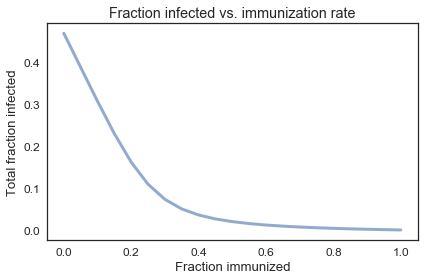

In [24]:
plot(infected_sweep)

decorate(xlabel='Fraction immunized',
         ylabel='Total fraction infected',
         title='Fraction infected vs. immunization rate',
         legend=False)

savefig('figs/chap05-fig03.pdf')

If 40% of the population is immunized, less than 4% of the population gets sick.

### Logistic function

To model the effect of a hand-washing campaign, I'll use a [generalized logistic function](https://en.wikipedia.org/wiki/Generalised_logistic_function) (GLF), which is a convenient function for modeling curves that have a generally sigmoid shape.  The parameters of the GLF correspond to various features of the curve in a way that makes it easy to find a function that has the shape you want, based on data or background information about the scenario.

In [25]:
def logistic(x, A=0, B=1, C=1, M=0, K=1, Q=1, nu=1):
    """Computes the generalize logistic function.
    
    A: controls the lower bound
    B: controls the steepness of the transition 
    C: not all that useful, AFAIK
    M: controls the location of the transition
    K: controls the upper bound
    Q: shift the transition left or right
    nu: affects the symmetry of the transition
    
    returns: float or array
    """
    exponent = -B * (x - M)
    denom = C + Q * exp(exponent)
    return A + (K-A) / denom ** (1/nu)

The following array represents the range of possible spending.

In [26]:
spending = linspace(0, 1200, 21)

array([   0.,   60.,  120.,  180.,  240.,  300.,  360.,  420.,  480.,
        540.,  600.,  660.,  720.,  780.,  840.,  900.,  960., 1020.,
       1080., 1140., 1200.])

`compute_factor` computes the reduction in `beta` for a given level of campaign spending.

`M` is chosen so the transition happens around \$500.

`K` is the maximum reduction in `beta`, 20%.

`B` is chosen by trial and error to yield a curve that seems feasible.

In [37]:
def compute_factor(spending):
    """Reduction factor as a function of spending.
    
    spending: dollars from 0 to 1200
    
    returns: fractional reduction in beta
    """
    return logistic(spending, M=500, K=0.2, B=0.01)

Here's what it looks like.

Saving figure to file figs/chap05-fig04.pdf


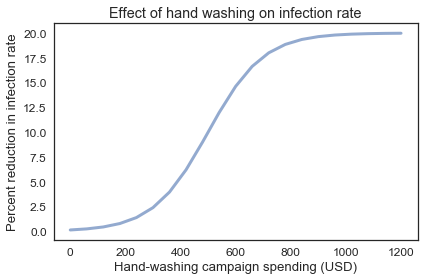

In [38]:
percent_reduction = compute_factor(spending) * 100

plot(spending, percent_reduction)

decorate(xlabel='Hand-washing campaign spending (USD)',
         ylabel='Percent reduction in infection rate',
         title='Effect of hand washing on infection rate',
         legend=False)

savefig('figs/chap05-fig04.pdf')

**Exercise:** Modify the parameters `M`, `K`, and `B`, and see what effect they have on the shape of the curve.  Read about the [generalized logistic function on Wikipedia](https://en.wikipedia.org/wiki/Generalised_logistic_function).  Modify the other parameters and see what effect they have.

### Hand washing

Now we can model the effect of a hand-washing campaign by modifying `beta`

In [39]:
def add_hand_washing(system, spending):
    """Modifies system to model the effect of hand washing.
    
    system: System object
    spending: campaign spending in USD
    """
    factor = compute_factor(spending)
    system.beta *= (1 - factor)

Let's start with the same values of `beta` and `gamma` we've been using.

In [40]:
tc = 3      # time between contacts in days 
tr = 4      # recovery time in days

beta = 1 / tc      # contact rate in per day
gamma = 1 / tr     # recovery rate in per day

beta, gamma

(0.3333333333333333, 0.25)

Now we can sweep different levels of campaign spending.

In [41]:
spending_array = linspace(0, 1200, 13)

for spending in spending_array:
    system = make_system(beta, gamma)
    add_hand_washing(system, spending)
    results = run_simulation(system, update_func)
    print(spending, system.beta, calc_total_infected(results))

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
4  0.972550  0.014964  0.012486
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
4  0.972550  0.014964  0.012486
5  0.967705  0.016068  0.016227
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985231  0.011991  0.002778
2   0.981299  0.012926  0.005776
3   0.977076  0.013917  0.009007
4   0.972550  0.014964  0.012486
5   0.967705  0.016068  0.016227
6   0.962529  0.017227  0.020244
7   0.957009  0.018440  0.024551
8   0.951135  0.019704  0.029161
9   0.944896  0.021017  0.034087
10  0.938285  0.022374  0.039341
11  0.931297  0.023768  0.044935
12  0.923928  0.025195  0.050877
13  0.916179  0.026645  0.057176
14  0.908053  0.028110  0.063837
15  0.899556  0.029580  0.070864
16  0.890698  0.031043  0.078259
17  0.881494  0.032486  0.086020
18  0.871961  0.033897  0.094142
19  0.862122  0.035262  0.102616
20  0.852002  0.036567  0.111432
21  0.841631  0.037796  0.120573
22  0.831042  0.038936  0.130022
23  0.820270  0.039974  0.139756
24  0.809355  0.040895  0.149750
25  0.798337  0.041690  0.159973
26  0.787258  0.042346  0.170396
27  0.776160  0.042857  0.180982
28  0.765087  0.043216  0.191697
29  0.7540

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985240  0.011983  0.002778
2   0.981318  0.012908  0.005773
3   0.977111  0.013888  0.009000
4   0.972604  0.014923  0.012473
5   0.967783  0.016013  0.016203
6   0.962636  0.017157  0.020207
7   0.957150  0.018353  0.024496
8   0.951316  0.019600  0.029084
9   0.945123  0.020893  0.033984
10  0.938565  0.022228  0.039208
11  0.931636  0.023600  0.044764
12  0.924333  0.025002  0.050664
13  0.916657  0.026428  0.056915
14  0.908611  0.027867  0.063522
15  0.900202  0.029310  0.070489
16  0.891438  0.030745  0.077816
17  0.882335  0.032162  0.085502
18  0.872910  0.033547  0.093543
19  0.863184  0.034886  0.101930
20  0.853183  0.036166  0.110651
21  0.842934  0.037373  0.119693
22  0.832471  0.038493  0.129036
23  0.821828  0.039513  0.138659
24  0.811042  0.040420  0.148538
25  0.800154  0.041203  0.158643
26  0.789204  0.041852  0.168943
27  0.778234  0.042360  0.179406
28  0.767285  0.042719  0.189996
29  0.7563

[76 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985261  0.011961  0.002778
2   0.981370  0.012862  0.005768
3   0.977203  0.013814  0.008984
4   0.972746  0.014817  0.012437
5   0.967987  0.015872  0.016141
6   0.962914  0.016977  0.020109
7   0.957517  0.018130  0.024354
8   0.951785  0.019329  0.028886
9   0.945711  0.020571  0.033718
10  0.939287  0.021852  0.038861
11  0.932511  0.023165  0.044324
12  0.925378  0.024506  0.050115
13  0.917891  0.025867  0.056242
14  0.910051  0.027240  0.062709
15  0.901866  0.028615  0.069519
16  0.893346  0.029982  0.076672
17  0.884502  0.031330  0.084168
18  0.875353  0.032647  0.092000
19  0.865918  0.033920  0.100162
20  0.856220  0.035138  0.108642
21  0.846286  0.036287  0.117427
22  0.836147  0.037355  0.126498
23  0.825834  0.038329  0.135837
24  0.815383  0.039197  0.145419
25  0.804831  0.039951  0.155219
26  0.794214  0.040579  0.165206
27  0.783573  0.041075  0.175351
28  0.772947  0.04143

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985314  0.011909  0.002778
2   0.981496  0.012749  0.005755
3   0.977424  0.013634  0.008942
4   0.973088  0.014561  0.012351
5   0.968477  0.015532  0.015991
6   0.963583  0.016543  0.019874
7   0.958396  0.017594  0.024010
8   0.952909  0.018683  0.028408
9   0.947116  0.019805  0.033079
10  0.941013  0.020957  0.038030
11  0.934596  0.022134  0.043269
12  0.927865  0.023332  0.048803
13  0.920821  0.024543  0.054636
14  0.913467  0.025761  0.060772
15  0.905810  0.026978  0.067212
16  0.897858  0.028185  0.073957
17  0.889624  0.029373  0.081003
18  0.881122  0.030532  0.088346
19  0.872368  0.031653  0.095979
20  0.863383  0.032725  0.103892
21  0.854189  0.033737  0.112074
22  0.844813  0.034680  0.120508
23  0.835279  0.035543  0.129178
24  0.825619  0.036317  0.138063
25  0.815863  0.036994  0.147143
26  0.806042  0.037567  0.156391
27  0.796189  0.038028  0.165783
28  0.786337  0.038373  0.175290
29  0.7765

16  0.918758  0.020087  0.061154
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985593  0.011630  0.002778
2   0.982154  0.012161  0.005685
3   0.978571  0.012704  0.008725
4   0.974841  0.013257  0.011901
5   0.970964  0.013820  0.015216
6   0.966939  0.014391  0.018671
7   0.962764  0.014968  0.022268
8   0.958441  0.015549  0.026010
9   0.953970  0.016132  0.029897
10  0.949353  0.016716  0.033931
11  0.944593  0.017298  0.038110
12  0.939691  0.017875  0.042434
13  0.934651  0.018446  0.046903
14  0.929479  0.019006  0.051514
15  0.924180  0.019555  0.056266
16  0.918758  0.020087  0.061154
17  0.913221  0.020602  0.066176
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985593  0.011630  0.002778
2   0.982154  0.012161  0.005685
3   0.978571  0.012704  0.008725
4   0.974841  0.013257  0.011901
5   0.970964  0.013820  0.015216
6   0.966939  0.014391  0.018671
7   0.962764  0.014968  0.022268
8   0.958441  0.015549  0.026010
9   0.9539

5  0.972381  0.012856  0.014763
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985762  0.011460  0.002778
2  0.982547  0.011810  0.005643
3  0.979244  0.012160  0.008595
4  0.975855  0.012509  0.011636
5  0.972381  0.012856  0.014763
6  0.968823  0.013200  0.017977
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985762  0.011460  0.002778
2  0.982547  0.011810  0.005643
3  0.979244  0.012160  0.008595
4  0.975855  0.012509  0.011636
5  0.972381  0.012856  0.014763
6  0.968823  0.013200  0.017977
7  0.965184  0.013539  0.021277
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985762  0.011460  0.002778
2  0.982547  0.011810  0.005643
3  0.979244  0.012160  0.008595
4  0.975855  0.012509  0.011636
5  0.972381  0.012856  0.014763
6  0.968823  0.013200  0.017977
7  0.965184  0.013539  0.021277
8  0.961465  0.013874  0.024662
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985762  0.011460  0.002778
2  0.982

600.0 0.28459609475799963 0.26731703056804546
          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
2  0.982799  0.011586  0.005615
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
2  0.982799  0.011586  0.005615
3  0.979672  0.011816  0.008512
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
2  0.982799  0.011586  0.005615
3  0.979672  0.011816  0.008512
4  0.976493  0.012041  0.011466
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
2  0.982799  0.011586  0.005615
3  0.979672  0.011816  0.008512
4  0.976493  0.012041  0.011466
5  0.973264  0.012260  0.014476
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985872  0.011351  0.002778
2  0

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985924  0.011298  0.002778
2   0.982918  0.011479  0.005602
3   0.979874  0.011654  0.008472
4   0.976793  0.011822  0.011386
5   0.973677  0.011982  0.014341
6   0.970529  0.012135  0.017337
7   0.967351  0.012279  0.020370
8   0.964146  0.012414  0.023440
9   0.960917  0.012540  0.026543
10  0.957665  0.012656  0.029678
11  0.954395  0.012763  0.032842
12  0.951108  0.012859  0.036033
13  0.947808  0.012944  0.039248
14  0.944498  0.013019  0.042484
15  0.941180  0.013082  0.045739
16  0.937858  0.013133  0.049009
17  0.934534  0.013174  0.052292
18  0.931212  0.013202  0.055586
19  0.927895  0.013219  0.058886
20  0.924585  0.013224  0.062191
21  0.921286  0.013217  0.065497
22  0.918000  0.013198  0.068801
23  0.914731  0.013168  0.072101
24  0.911481  0.013126  0.075393
25  0.908253  0.013073  0.078674
26  0.905049  0.013008  0.081943
27  0.901872  0.012933  0.085195
28  0.898725  0.012847  0.088428
29  0.8956

[87 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985946  0.011277  0.002778
2   0.982968  0.011436  0.005597
3   0.979957  0.011588  0.008456
4   0.976915  0.011733  0.011353
5   0.973845  0.011870  0.014286
6   0.970748  0.011998  0.017253
7   0.967628  0.012119  0.020253
8   0.964487  0.012230  0.023283
9   0.961327  0.012332  0.026340
10  0.958152  0.012425  0.029423
11  0.954963  0.012508  0.032529
12  0.951763  0.012580  0.035656
13  0.948556  0.012642  0.038801
14  0.945344  0.012694  0.041962
15  0.942129  0.012735  0.045136
16  0.938916  0.012765  0.048319
17  0.935705  0.012784  0.051511
18  0.932501  0.012793  0.054707
19  0.929305  0.012790  0.057905
20  0.926122  0.012776  0.061102
21  0.922952  0.012752  0.064296
22  0.919800  0.012716  0.067484
23  0.916667  0.012670  0.070663
24  0.913555  0.012614  0.073831
25  0.910469  0.012547  0.076984
26  0.907409  0.012470  0.080121
27  0.904378  0.012384  0.083239
28  0.901378  0.01228

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985957  0.011265  0.002778
2   0.982993  0.011413  0.005594
3   0.980000  0.011553  0.008447
4   0.976979  0.011686  0.011335
5   0.973933  0.011811  0.014257
6   0.970863  0.011927  0.017210
7   0.967773  0.012035  0.020191
8   0.964666  0.012134  0.023200
9   0.961542  0.012224  0.026234
10  0.958406  0.012304  0.029290
11  0.955259  0.012375  0.032366
12  0.952105  0.012436  0.035460
13  0.948946  0.012486  0.038569
14  0.945784  0.012526  0.041690
15  0.942623  0.012556  0.044822
16  0.939465  0.012575  0.047960
17  0.936313  0.012583  0.051104
18  0.933169  0.012581  0.054250
19  0.930036  0.012569  0.057395
20  0.926917  0.012546  0.060537
21  0.923814  0.012512  0.063674
22  0.920730  0.012468  0.066802
23  0.917667  0.012414  0.069919
24  0.914627  0.012351  0.073022
25  0.911613  0.012277  0.076110
26  0.908626  0.012194  0.079179
27  0.905670  0.012102  0.082228
28  0.902745  0.012001  0.085254
29  0.8998

Here's a function that sweeps a range of spending and stores the results in a `SweepSeries`.

In [42]:
def sweep_hand_washing(spending_array):
    """Run simulations with a range of spending.
    
    spending_array: array of dollars from 0 to 1200
    
    returns: Sweep object
    """
    sweep = SweepSeries()
    
    for spending in spending_array:
        system = make_system(beta, gamma)
        add_hand_washing(system, spending)
        results = run_simulation(system, update_func)
        sweep[spending] = calc_total_infected(results)
        
    return sweep

Here's how we run it.

In [46]:
spending_array = linspace(0, 1200, 20)
infected_sweep = sweep_hand_washing(spending_array)

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
4  0.972550  0.014964  0.012486
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013917  0.009007
4  0.972550  0.014964  0.012486
5  0.967705  0.016068  0.016227
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985231  0.011991  0.002778
2  0.981299  0.012926  0.005776
3  0.977076  0.013

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985231  0.011991  0.002778
2   0.981299  0.012926  0.005776
3   0.977076  0.013917  0.009007
4   0.972550  0.014964  0.012486
5   0.967705  0.016068  0.016227
6   0.962529  0.017227  0.020244
7   0.957009  0.018440  0.024551
8   0.951135  0.019704  0.029161
9   0.944896  0.021017  0.034087
10  0.938285  0.022374  0.039341
11  0.931297  0.023768  0.044935
12  0.923928  0.025195  0.050877
13  0.916179  0.026645  0.057176
14  0.908053  0.028110  0.063837
15  0.899556  0.029580  0.070864
16  0.890698  0.031043  0.078259
17  0.881494  0.032486  0.086020
18  0.871961  0.033897  0.094142
19  0.862122  0.035262  0.102616
20  0.852002  0.036567  0.111432
21  0.841631  0.037796  0.120573
22  0.831042  0.038936  0.130022
23  0.820270  0.039974  0.139756
24  0.809355  0.040895  0.149750
25  0.798337  0.041690  0.159973
26  0.787258  0.042346  0.170396
27  0.776160  0.042857  0.180982
28  0.765087  0.043216  0.191697
29  0.7540

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985236  0.011987  0.002778
2   0.981309  0.012917  0.005774
3   0.977094  0.013902  0.009004
4   0.972578  0.014943  0.012479
5   0.967745  0.016040  0.016215
6   0.962584  0.017191  0.020225
7   0.957082  0.018395  0.024523
8   0.951228  0.019650  0.029121
9   0.945013  0.020953  0.034034
10  0.938429  0.022298  0.039272
11  0.931472  0.023681  0.044847
12  0.924137  0.025096  0.050767
13  0.916426  0.026533  0.057041
14  0.908341  0.027985  0.063674
15  0.899889  0.029440  0.070671
16  0.891080  0.030889  0.078031
17  0.881928  0.032319  0.085753
18  0.872451  0.033716  0.093833
19  0.862670  0.035068  0.102262
20  0.852611  0.036360  0.111029
21  0.842304  0.037578  0.120119
22  0.831779  0.038707  0.129513
23  0.821074  0.039736  0.139190
24  0.810226  0.040650  0.149124
25  0.799275  0.041438  0.159286
26  0.788262  0.042091  0.169646
27  0.777230  0.042601  0.180169
28  0.766221  0.042960  0.190819
29  0.7552

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985258  0.011964  0.002778
2   0.981362  0.012869  0.005769
3   0.977188  0.013825  0.008986
4   0.972724  0.014834  0.012442
5   0.967955  0.015894  0.016151
6   0.962871  0.017004  0.020124
7   0.957460  0.018164  0.024375
8   0.951713  0.019371  0.028917
9   0.945621  0.020620  0.033759
10  0.939177  0.021909  0.038914
11  0.932377  0.023232  0.044392
12  0.925218  0.024582  0.050200
13  0.917702  0.025953  0.056345
14  0.909831  0.027336  0.062833
15  0.901612  0.028721  0.069667
16  0.893054  0.030098  0.076847
17  0.884171  0.031457  0.084372
18  0.874980  0.032784  0.092236
19  0.865500  0.034068  0.100432
20  0.855756  0.035295  0.108949
21  0.845774  0.036453  0.117773
22  0.835585  0.037529  0.126886
23  0.825222  0.038510  0.136268
24  0.814720  0.039384  0.145896
25  0.804116  0.040142  0.155742
26  0.793449  0.040774  0.165777
27  0.782757  0.041272  0.175971
           S         I         R
0   0.9888

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985283  0.011939  0.002778
2   0.981423  0.012814  0.005763
3   0.977296  0.013738  0.008966
4   0.972891  0.014709  0.012401
5   0.968195  0.015728  0.016078
6   0.963198  0.016793  0.020010
7   0.957890  0.017902  0.024208
8   0.952263  0.019054  0.028683
9   0.946309  0.020245  0.033447
10  0.940022  0.021470  0.038508
11  0.933399  0.022725  0.043876
12  0.926438  0.024005  0.049557
13  0.919141  0.025301  0.055558
14  0.911509  0.026607  0.061883
15  0.903551  0.027914  0.068535
16  0.895274  0.029212  0.075514
17  0.886692  0.030491  0.082817
18  0.877820  0.031740  0.090439
19  0.868677  0.032948  0.098375
20  0.859285  0.034103  0.106612
21  0.849669  0.035194  0.115137
22  0.839856  0.036208  0.123936
23  0.829877  0.037135  0.132988
24  0.819764  0.037964  0.142272
25  0.809551  0.038686  0.151763
26  0.799274  0.039291  0.161434
27  0.788969  0.039774  0.171257
28  0.778671  0.040128  0.181201
29  0.7684

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985395  0.011828  0.002778
2   0.981688  0.012577  0.005735
3   0.977761  0.013360  0.008879
4   0.973607  0.014174  0.012219
5   0.969218  0.015019  0.015762
6   0.964589  0.015894  0.019517
7   0.959713  0.016796  0.023491
8   0.954587  0.017724  0.027690
9   0.949206  0.018673  0.032121
10  0.943569  0.019642  0.036789
11  0.937675  0.020625  0.041699
12  0.931524  0.021620  0.046856
13  0.925120  0.022620  0.052261
14  0.918465  0.023620  0.057916
15  0.911565  0.024614  0.063821
16  0.904430  0.025596  0.069974
17  0.897068  0.026559  0.076373
18  0.889490  0.027497  0.083013
19  0.881712  0.028401  0.089887
20  0.873748  0.029264  0.096987
21  0.865617  0.030080  0.104303
22  0.857336  0.030841  0.111823
23  0.848927  0.031540  0.119534
24  0.840412  0.032170  0.127418
25  0.831814  0.032725  0.135461
26  0.823157  0.033201  0.143642
27  0.814465  0.033592  0.151942
28  0.805764  0.033895  0.160341
29  0.7970

[86 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985489  0.011733  0.002778
2   0.981912  0.012377  0.005711
3   0.978152  0.013043  0.008805
4   0.974205  0.013729  0.012066
5   0.970067  0.014435  0.015498
6   0.965735  0.015158  0.019107
7   0.961206  0.015898  0.022896
8   0.956478  0.016651  0.026871
9   0.951550  0.017416  0.031034
10  0.946423  0.018189  0.035388
11  0.941097  0.018968  0.039935
12  0.935574  0.019749  0.044677
13  0.929858  0.020528  0.049614
14  0.923952  0.021302  0.054746
15  0.917863  0.022066  0.060072
16  0.911597  0.022815  0.065588
17  0.905162  0.023546  0.071292
18  0.898568  0.024254  0.077178
19  0.891825  0.024933  0.083242
20  0.884946  0.025579  0.089475
21  0.877942  0.026188  0.095870
22  0.870829  0.026754  0.102417
23  0.863621  0.027274  0.109105
24  0.856334  0.027743  0.115924
25  0.848983  0.028157  0.122859
26  0.841587  0.028514  0.129899
27  0.834163  0.028810  0.137027
28  0.826728  0.02904

[95 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985602  0.011620  0.002778
2   0.982176  0.012141  0.005683
3   0.978610  0.012672  0.008718
4   0.974900  0.013214  0.011886
5   0.971047  0.013764  0.015190
6   0.967049  0.014321  0.018630
7   0.962906  0.014883  0.022211
8   0.958620  0.015449  0.025931
9   0.954190  0.016017  0.029794
10  0.949618  0.016584  0.033798
11  0.944908  0.017149  0.037944
12  0.940061  0.017708  0.042231
13  0.935081  0.018261  0.046658
14  0.929974  0.018803  0.051223
15  0.924743  0.019333  0.055924
16  0.919395  0.019848  0.060757
17  0.913937  0.020344  0.065719
18  0.908375  0.020820  0.070805
19  0.902718  0.021272  0.076010
20  0.896974  0.021698  0.081328
21  0.891153  0.022095  0.086752
22  0.885263  0.022461  0.092276
23  0.879315  0.022793  0.097891
24  0.873320  0.023090  0.103590
25  0.867288  0.023349  0.109362
26  0.861231  0.023570  0.115200
27  0.855159  0.023749  0.121092
28  0.849084  0.02388

31  0.870406  0.016194  0.113400
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985804  0.011418  0.002778
2   0.982644  0.011724  0.005632
3   0.979409  0.012028  0.008563
4   0.976101  0.012328  0.011570
5   0.972723  0.012625  0.014652
6   0.969275  0.012917  0.017809
7   0.965760  0.013203  0.021038
8   0.962180  0.013482  0.024338
9   0.958538  0.013754  0.027709
10  0.954836  0.014017  0.031147
11  0.951079  0.014270  0.034651
12  0.947268  0.014513  0.038219
13  0.943408  0.014745  0.041847
14  0.939502  0.014964  0.045533
15  0.935555  0.015170  0.049274
16  0.931570  0.015363  0.053067
17  0.927552  0.015540  0.056908
18  0.923505  0.015702  0.060793
19  0.919433  0.015848  0.064718
20  0.915342  0.015977  0.068680
21  0.911236  0.016089  0.072675
22  0.907120  0.016183  0.076697
23  0.902998  0.016259  0.080743
24  0.898876  0.016317  0.084808
25  0.894758  0.016355  0.088887
26  0.890649  0.016375  0.092976
27  0.886554  0.016376  0.097069
28  0.8824

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
2  0.982789  0.011594  0.005616
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
2  0.982789  0.011594  0.005616
3  0.979656  0.011829  0.008515
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
2  0.982789  0.011594  0.005616
3  0.979656  0.011829  0.008515
4  0.976469  0.012059  0.011472
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
2  0.982789  0.011594  0.005616
3  0.979656  0.011829  0.008515
4  0.976469  0.012059  0.011472
5  0.973231  0.012282  0.014487
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985867  0.011355  0.002778
2  0.982789  0.011594  0.005616
3  0.979656  0.011

[74 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985907  0.011315  0.002778
2   0.982880  0.011514  0.005607
3   0.979809  0.011706  0.008485
4   0.976697  0.011892  0.011411
5   0.973545  0.012071  0.014384
6   0.970356  0.012242  0.017402
7   0.967132  0.012405  0.020463
8   0.963876  0.012560  0.023564
9   0.960591  0.012705  0.026704
10  0.957279  0.012841  0.029880
11  0.953944  0.012966  0.033090
12  0.950587  0.013081  0.036332
13  0.947213  0.013185  0.039602
14  0.943824  0.013278  0.042898
15  0.940423  0.013359  0.046218
16  0.937014  0.013429  0.049558
17  0.933599  0.013486  0.052915
18  0.930182  0.013531  0.056286
19  0.926767  0.013564  0.059669
20  0.923355  0.013584  0.063060
21  0.919952  0.013592  0.066456
22  0.916558  0.013587  0.069854
23  0.913179  0.013570  0.073251
24  0.909816  0.013540  0.076644
25  0.906473  0.013498  0.080029
26  0.903153  0.013444  0.083403
27  0.899858  0.013378  0.086764
28  0.896591  0.01330

4  0.976902  0.011742  0.011356
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985943  0.011279  0.002778
2  0.982963  0.011440  0.005597
3  0.979948  0.011594  0.008457
4  0.976902  0.011742  0.011356
5  0.973827  0.011881  0.014291
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985943  0.011279  0.002778
2  0.982963  0.011440  0.005597
3  0.979948  0.011594  0.008457
4  0.976902  0.011742  0.011356
5  0.973827  0.011881  0.014291
6  0.970726  0.012012  0.017262
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985943  0.011279  0.002778
2  0.982963  0.011440  0.005597
3  0.979948  0.011594  0.008457
4  0.976902  0.011742  0.011356
5  0.973827  0.011881  0.014291
6  0.970726  0.012012  0.017262
7  0.967600  0.012135  0.020265
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985943  0.011279  0.002778
2  0.982963  0.011440  0.005597
3  0.979948  0.011594  0.008457
4  0.976902  0.011742  0.011356
5  0.973

[79 rows x 3 columns]
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985943  0.011279  0.002778
2   0.982963  0.011440  0.005597
3   0.979948  0.011594  0.008457
4   0.976902  0.011742  0.011356
5   0.973827  0.011881  0.014291
6   0.970726  0.012012  0.017262
7   0.967600  0.012135  0.020265
8   0.964452  0.012249  0.023299
9   0.961286  0.012353  0.026361
10  0.958102  0.012448  0.029449
11  0.954905  0.012534  0.032561
12  0.951697  0.012608  0.035695
13  0.948480  0.012673  0.038847
14  0.945258  0.012727  0.042015
15  0.942033  0.012770  0.045197
16  0.938808  0.012802  0.048389
17  0.935586  0.012824  0.051590
18  0.932370  0.012834  0.054796
19  0.929162  0.012833  0.058004
20  0.925966  0.012821  0.061213
21  0.922784  0.012798  0.064418
22  0.919618  0.012765  0.067618
23  0.916471  0.012720  0.070809
24  0.913346  0.012665  0.073989
25  0.910245  0.012600  0.077155
26  0.907170  0.012524  0.080305
27  0.904125  0.012439  0.083436
28  0.901110  0.01234

25  0.910966  0.012430  0.076605
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985951  0.011272  0.002778
2   0.982979  0.011426  0.005596
3   0.979975  0.011573  0.008452
4   0.976943  0.011712  0.011345
5   0.973883  0.011844  0.014273
6   0.970798  0.011968  0.017234
7   0.967691  0.012083  0.020226
8   0.964564  0.012189  0.023247
9   0.961420  0.012285  0.026294
10  0.958262  0.012373  0.029365
11  0.955091  0.012450  0.032459
12  0.951911  0.012517  0.035571
13  0.948725  0.012575  0.038701
14  0.945535  0.012621  0.041844
15  0.942343  0.012657  0.044999
16  0.939154  0.012682  0.048164
17  0.935969  0.012697  0.051334
18  0.932791  0.012701  0.054509
19  0.929622  0.012694  0.057684
20  0.926467  0.012676  0.060857
21  0.923326  0.012647  0.064026
22  0.920203  0.012608  0.067188
23  0.917101  0.012559  0.070340
24  0.914021  0.012499  0.073480
25  0.910966  0.012430  0.076605
26  0.907938  0.012350  0.079712
           S         I         R
0   0.9888

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985954  0.011268  0.002778
2   0.982987  0.011418  0.005595
3   0.979990  0.011561  0.008449
4   0.976964  0.011696  0.011339
5   0.973912  0.011824  0.014264
6   0.970837  0.011944  0.017220
7   0.967740  0.012054  0.020205
8   0.964625  0.012156  0.023219
9   0.961493  0.012249  0.026258
10  0.958348  0.012332  0.029320
11  0.955191  0.012405  0.032403
12  0.952027  0.012469  0.035505
13  0.948857  0.012522  0.038622
14  0.945683  0.012564  0.041752
15  0.942510  0.012597  0.044893
16  0.939339  0.012618  0.048042
17  0.936174  0.012629  0.051197
18  0.933016  0.012629  0.054354
19  0.929869  0.012619  0.057512
20  0.926736  0.012598  0.060666
21  0.923618  0.012567  0.063816
22  0.920518  0.012525  0.066957
23  0.917439  0.012473  0.070089
24  0.914383  0.012411  0.073207
25  0.911352  0.012339  0.076309
26  0.908349  0.012257  0.079394
27  0.905375  0.012166  0.082458
28  0.902434  0.012066  0.085500
29  0.8995

45  0.859186  0.009317  0.131497
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985956  0.011266  0.002778
2   0.982992  0.011414  0.005594
3   0.979998  0.011555  0.008448
4   0.976976  0.011688  0.011336
5   0.973928  0.011813  0.014258
6   0.970858  0.011931  0.017212
7   0.967767  0.012039  0.020194
8   0.964657  0.012139  0.023204
9   0.961532  0.012229  0.026239
10  0.958394  0.012310  0.029296
11  0.955245  0.012381  0.032374
12  0.952089  0.012442  0.035469
13  0.948927  0.012493  0.038580
14  0.945763  0.012534  0.041703
15  0.942599  0.012564  0.044836
16  0.939439  0.012584  0.047978
17  0.936284  0.012593  0.051123
18  0.933137  0.012591  0.054272
19  0.930001  0.012579  0.057419
20  0.926879  0.012556  0.060564
21  0.923773  0.012523  0.063703
22  0.920686  0.012480  0.066834
23  0.917619  0.012427  0.069954
24  0.914576  0.012363  0.073061
25  0.911558  0.012290  0.076152
26  0.908568  0.012207  0.079224
27  0.905608  0.012116  0.082276
28  0.9026

48  0.853197  0.008709  0.138094
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985958  0.011265  0.002778
2   0.982995  0.011411  0.005594
3   0.980002  0.011551  0.008447
4   0.976982  0.011683  0.011335
5   0.973937  0.011808  0.014255
6   0.970869  0.011924  0.017207
7   0.967781  0.012031  0.020188
8   0.964674  0.012130  0.023196
9   0.961553  0.012219  0.026229
10  0.958418  0.012299  0.029283
11  0.955274  0.012369  0.032358
12  0.952121  0.012429  0.035450
13  0.948965  0.012478  0.038557
14  0.945805  0.012518  0.041677
15  0.942647  0.012547  0.044806
16  0.939492  0.012565  0.047943
17  0.936342  0.012573  0.051084
18  0.933201  0.012571  0.054228
19  0.930072  0.012558  0.057370
20  0.926956  0.012534  0.060510
21  0.923856  0.012500  0.063643
22  0.920775  0.012456  0.066769
23  0.917715  0.012402  0.069883
24  0.914679  0.012338  0.072983
25  0.911668  0.012264  0.076068
26  0.908686  0.012181  0.079134
27  0.905733  0.012089  0.082179
28  0.9028

11  0.955289  0.012362  0.032349
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985958  0.011264  0.002778
2   0.982996  0.011410  0.005594
3   0.980004  0.011549  0.008446
4   0.976985  0.011681  0.011334
5   0.973941  0.011805  0.014254
6   0.970875  0.011920  0.017205
7   0.967788  0.012027  0.020185
8   0.964683  0.012125  0.023192
9   0.961564  0.012213  0.026223
10  0.958431  0.012292  0.029276
11  0.955289  0.012362  0.032349
12  0.952139  0.012421  0.035440
           S         I         R
0   0.988889  0.011111  0.000000
1   0.985958  0.011264  0.002778
2   0.982996  0.011410  0.005594
3   0.980004  0.011549  0.008446
4   0.976985  0.011681  0.011334
5   0.973941  0.011805  0.014254
6   0.970875  0.011920  0.017205
7   0.967788  0.012027  0.020185
8   0.964683  0.012125  0.023192
9   0.961564  0.012213  0.026223
10  0.958431  0.012292  0.029276
11  0.955289  0.012362  0.032349
12  0.952139  0.012421  0.035440
13  0.948985  0.012470  0.038545
          

,values
0.000000,0.466770
63.157895,0.465418
126.315789,0.462905
189.473684,0.458291
252.631579,0.449980
315.789474,0.435540
378.947368,0.411960
442.105263,0.377183
505.263158,0.333171
568.421053,0.287633


And here's what it looks like.

Saving figure to file figs/chap05-fig05.pdf


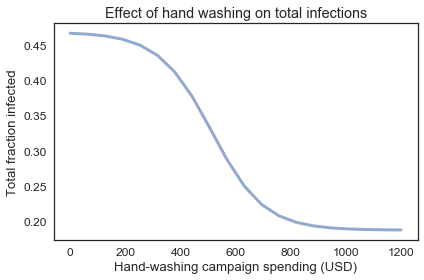

In [47]:
plot(infected_sweep)

decorate(xlabel='Hand-washing campaign spending (USD)',
         ylabel='Total fraction infected',
         title='Effect of hand washing on total infections',
         legend=False)

savefig('figs/chap05-fig05.pdf')

Now let's put it all together to make some public health spending decisions.

### Optimization

Suppose we have \$1200 to spend on any combination of vaccines and a hand-washing campaign.

In [48]:
num_students = 90
budget = 1200
price_per_dose = 100
max_doses = int(budget / price_per_dose)
dose_array = linrange(max_doses, endpoint=True)
max_doses

12

We can sweep through a range of doses from, 0 to `max_doses`, model the effects of immunization and the hand-washing campaign, and run simulations.

For each scenario, we compute the fraction of students who get sick.

In [49]:
for doses in dose_array:
    fraction = doses / num_students
    spending = budget - doses * price_per_dose
    
    system = make_system(beta, gamma)
    add_immunization(system, fraction)
    add_hand_washing(system, spending)
    
    results, run_simulation(system, update_func)
    print(doses, system.init.S, system.beta, calc_total_infected(results))

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
4  0.976985  0.011681  0.011334
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
4  0.976985  0.011681  0.011334
5  0.973941  0.011805  0.014254
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985958  0.011264  0.002778
2   0.982996  0.011410  0.005594
3   0.980004  0.011549  0.008446
4   0.976985  0.011681  0.011334
5   0.973941  0.011805  0.014254
6   0.970875  0.011920  0.017205
7   0.967788  0.012027  0.020185
8   0.964683  0.012125  0.023192
9   0.961564  0.012213  0.026223
10  0.958431  0.012292  0.029276
11  0.955289  0.012362  0.032349
12  0.952139  0.012421  0.035440
13  0.948985  0.012470  0.038545
14  0.945828  0.012509  0.041663
15  0.942672  0.012538  0.044790
16  0.939520  0.012556  0.047924
17  0.936373  0.012563  0.051063
18  0.933236  0.012560  0.054204
19  0.930109  0.012547  0.057344
20  0.926997  0.012523  0.060481
21  0.923900  0.012488  0.063612
22  0.920823  0.012444  0.066734
23  0.917767  0.012389  0.069844
24  0.914734  0.012324  0.072942
25  0.911727  0.012250  0.076023
26  0.908748  0.012167  0.079085
27  0.905799  0.012074  0.082127
28  0.902882  0.011973  0.085146
29  0.8999

           S         I         R
0   0.977778  0.011111  0.011111
1   0.974879  0.011232  0.013889
2   0.971957  0.011346  0.016697
3   0.969014  0.011452  0.019533
4   0.966053  0.011550  0.022396
5   0.963076  0.011640  0.025284
6   0.960085  0.011721  0.028194
7   0.957082  0.011794  0.031124
8   0.954070  0.011857  0.034073
9   0.951052  0.011911  0.037037
10  0.948029  0.011956  0.040015
11  0.945004  0.011992  0.043004
12  0.941981  0.012018  0.046002
13  0.938960  0.012034  0.049006
14  0.935945  0.012040  0.052015
15  0.932938  0.012037  0.055025
16  0.929942  0.012024  0.058034
17  0.926958  0.012002  0.061040
18  0.923989  0.011970  0.064041
19  0.921038  0.011929  0.067033
20  0.918107  0.011878  0.070015
21  0.915197  0.011819  0.072985
22  0.912310  0.011750  0.075939
23  0.909450  0.011673  0.078877
24  0.906617  0.011587  0.081795
25  0.903814  0.011494  0.084692
26  0.901042  0.011392  0.087565
27  0.898303  0.011283  0.090414
28  0.895599  0.011167  0.093234
29  0.8929

           S         I         R
0   0.955556  0.011111  0.033333
1   0.952712  0.011177  0.036111
2   0.949859  0.011235  0.038905
3   0.947000  0.011285  0.041714
4   0.944138  0.011327  0.044536
5   0.941273  0.011360  0.047367
6   0.938409  0.011384  0.050207
7   0.935547  0.011399  0.053053
8   0.932691  0.011406  0.055903
9   0.929841  0.011404  0.058755
10  0.927001  0.011394  0.061606
11  0.924171  0.011375  0.064454
12  0.921356  0.011347  0.067298
13  0.918555  0.011310  0.070134
14  0.915772  0.011266  0.072962
15  0.913009  0.011213  0.075778
16  0.910267  0.011152  0.078582
17  0.907547  0.011083  0.081370
18  0.904853  0.011007  0.084140
19  0.902185  0.010923  0.086892
20  0.899546  0.010832  0.089623
21  0.896936  0.010734  0.092331
22  0.894357  0.010629  0.095014
23  0.891810  0.010518  0.097671
24  0.889298  0.010401  0.100301
25  0.886820  0.010279  0.102901
26  0.884378  0.010151  0.105471
27  0.881974  0.010018  0.108009
28  0.879607  0.009880  0.110513
29  0.8772

           S         I         R
0   0.944444  0.011111  0.044444
1   0.941613  0.011165  0.047222
2   0.938776  0.011210  0.050013
3   0.935937  0.011247  0.052816
4   0.933096  0.011276  0.055628
5   0.930257  0.011296  0.058447
6   0.927422  0.011307  0.061271
7   0.924592  0.011310  0.064098
8   0.921770  0.011304  0.066925
9   0.918959  0.011290  0.069751
10  0.916159  0.011267  0.072574
11  0.913374  0.011235  0.075391
12  0.910605  0.011196  0.078199
13  0.907854  0.011147  0.080998
14  0.905123  0.011091  0.083785
15  0.902415  0.011027  0.086558
           S         I         R
0   0.944444  0.011111  0.044444
1   0.941613  0.011165  0.047222
2   0.938776  0.011210  0.050013
3   0.935937  0.011247  0.052816
4   0.933096  0.011276  0.055628
5   0.930257  0.011296  0.058447
6   0.927422  0.011307  0.061271
7   0.924592  0.011310  0.064098
8   0.921770  0.011304  0.066925
9   0.918959  0.011290  0.069751
10  0.916159  0.011267  0.072574
11  0.913374  0.011235  0.075391
12  0.9106

4.0 0.9444444444444445 0.26982839154517113 0.1875955039953746
          S         I         R
0  0.933333  0.011111  0.055556
          S         I         R
0  0.933333  0.011111  0.055556
1  0.930485  0.011181  0.058333
          S         I         R
0  0.933333  0.011111  0.055556
1  0.930485  0.011181  0.058333
2  0.927628  0.011243  0.061129
          S         I         R
0  0.933333  0.011111  0.055556
1  0.930485  0.011181  0.058333
2  0.927628  0.011243  0.061129
3  0.924764  0.011296  0.063939
          S         I         R
0  0.933333  0.011111  0.055556
1  0.930485  0.011181  0.058333
2  0.927628  0.011243  0.061129
3  0.924764  0.011296  0.063939
4  0.921896  0.011341  0.066763
          S         I         R
0  0.933333  0.011111  0.055556
1  0.930485  0.011181  0.058333
2  0.927628  0.011243  0.061129
3  0.924764  0.011296  0.063939
4  0.921896  0.011341  0.066763
5  0.919025  0.011377  0.069599
          S         I         R
0  0.933333  0.011111  0.055556
1  0.93048

[68 rows x 3 columns]
           S         I         R
0   0.900000  0.011111  0.088889
1   0.896846  0.011487  0.091667
2   0.893597  0.011865  0.094539
3   0.890252  0.012243  0.097505
4   0.886815  0.012620  0.100565
5   0.883285  0.012995  0.103720
6   0.879665  0.013366  0.106969
7   0.875956  0.013733  0.110311
8   0.872162  0.014094  0.113744
9   0.868285  0.014447  0.117267
10  0.864329  0.014792  0.120879
11  0.860296  0.015127  0.124577
12  0.856192  0.015449  0.128359
13  0.852020  0.015759  0.132221
14  0.847785  0.016054  0.136161
15  0.843492  0.016334  0.140175
16  0.839146  0.016596  0.144258
17  0.834754  0.016839  0.148407
18  0.830321  0.017063  0.152617
19  0.825852  0.017266  0.156882
20  0.821355  0.017446  0.161199
21  0.816835  0.017605  0.165560
22  0.812300  0.017739  0.169962
23  0.807755  0.017849  0.174396
24  0.803208  0.017934  0.178858
25  0.798664  0.017994  0.183342
26  0.794132  0.018028  0.187840
27  0.789616  0.018037  0.192347
28  0.785124  0.01801

36  0.726514  0.018951  0.254535
           S         I         R
0   0.888889  0.011111  0.100000
1   0.885675  0.011547  0.102778
2   0.882347  0.011988  0.105665
3   0.878906  0.012433  0.108662
4   0.875350  0.012880  0.111770
5   0.871682  0.013329  0.114990
6   0.867901  0.013777  0.118322
7   0.864010  0.014223  0.121766
8   0.860012  0.014666  0.125322
9   0.855907  0.015104  0.128989
10  0.851701  0.015534  0.132765
11  0.847396  0.015956  0.136648
12  0.842996  0.016366  0.140637
13  0.838507  0.016764  0.144729
14  0.833933  0.017147  0.148920
15  0.829280  0.017513  0.153207
16  0.824555  0.017860  0.157585
17  0.819763  0.018187  0.162050
18  0.814911  0.018492  0.166597
19  0.810008  0.018772  0.171220
20  0.805060  0.019027  0.175913
21  0.800076  0.019254  0.180669
22  0.795064  0.019453  0.185483
23  0.790031  0.019623  0.190346
24  0.784987  0.019761  0.195252
25  0.779939  0.019868  0.200192
26  0.774897  0.019944  0.205159
27  0.769869  0.019986  0.210145
28  0.7648

27  0.750580  0.019248  0.230172
           S         I         R
0   0.866667  0.011111  0.122222
1   0.863468  0.011532  0.125000
2   0.860161  0.011956  0.127883
3   0.856746  0.012383  0.130872
4   0.853222  0.012810  0.133968
5   0.849592  0.013238  0.137170
6   0.845856  0.013664  0.140480
7   0.842017  0.014087  0.143896
8   0.838078  0.014505  0.147417
9   0.834040  0.014916  0.151044
10  0.829909  0.015319  0.154773
11  0.825686  0.015712  0.158602
12  0.821377  0.016093  0.162530
13  0.816987  0.016460  0.166553
14  0.812521  0.016811  0.170668
15  0.807984  0.017145  0.174871
16  0.803383  0.017460  0.179157
17  0.798724  0.017754  0.183522
18  0.794015  0.018025  0.187961
19  0.789261  0.018272  0.192467
20  0.784471  0.018494  0.197035
21  0.779653  0.018689  0.201658
22  0.774813  0.018856  0.206331
23  0.769961  0.018995  0.211045
24  0.765103  0.019104  0.215793
25  0.760248  0.019182  0.220569
26  0.755405  0.019230  0.225365
27  0.750580  0.019248  0.230172
28  0.7457

The following function wraps that loop and stores the results in a `Sweep` object.

In [50]:
def sweep_doses(dose_array):
    """Runs simulations with different doses and campaign spending.
    
    dose_array: range of values for number of vaccinations
    
    return: Sweep object with total number of infections 
    """
    sweep = SweepSeries()
    
    for doses in dose_array:
        fraction = doses / num_students
        spending = budget - doses * price_per_dose
        
        system = make_system(beta, gamma)
        add_immunization(system, fraction)
        add_hand_washing(system, spending)
        
        results = run_simulation(system, update_func)
        sweep[doses] = calc_total_infected(results)

    return sweep

Now we can compute the number of infected students for each possible allocation of the budget.

In [51]:
infected_sweep = sweep_doses(dose_array)

          S         I    R
0  0.988889  0.011111  0.0
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
4  0.976985  0.011681  0.011334
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011549  0.008446
4  0.976985  0.011681  0.011334
5  0.973941  0.011805  0.014254
          S         I         R
0  0.988889  0.011111  0.000000
1  0.985958  0.011264  0.002778
2  0.982996  0.011410  0.005594
3  0.980004  0.011

           S         I         R
0   0.988889  0.011111  0.000000
1   0.985958  0.011264  0.002778
2   0.982996  0.011410  0.005594
3   0.980004  0.011549  0.008446
4   0.976985  0.011681  0.011334
5   0.973941  0.011805  0.014254
6   0.970875  0.011920  0.017205
7   0.967788  0.012027  0.020185
8   0.964683  0.012125  0.023192
9   0.961564  0.012213  0.026223
10  0.958431  0.012292  0.029276
11  0.955289  0.012362  0.032349
12  0.952139  0.012421  0.035440
13  0.948985  0.012470  0.038545
14  0.945828  0.012509  0.041663
15  0.942672  0.012538  0.044790
16  0.939520  0.012556  0.047924
17  0.936373  0.012563  0.051063
18  0.933236  0.012560  0.054204
19  0.930109  0.012547  0.057344
20  0.926997  0.012523  0.060481
21  0.923900  0.012488  0.063612
22  0.920823  0.012444  0.066734
23  0.917767  0.012389  0.069844
24  0.914734  0.012324  0.072942
25  0.911727  0.012250  0.076023
26  0.908748  0.012167  0.079085
27  0.905799  0.012074  0.082127
28  0.902882  0.011973  0.085146
29  0.8999

[84 rows x 3 columns]
           S         I         R
0   0.977778  0.011111  0.011111
1   0.974879  0.011232  0.013889
2   0.971957  0.011346  0.016697
3   0.969014  0.011452  0.019533
4   0.966053  0.011550  0.022396
5   0.963076  0.011640  0.025284
6   0.960085  0.011721  0.028194
7   0.957082  0.011794  0.031124
8   0.954070  0.011857  0.034073
9   0.951052  0.011911  0.037037
10  0.948029  0.011956  0.040015
11  0.945004  0.011992  0.043004
12  0.941981  0.012018  0.046002
13  0.938960  0.012034  0.049006
14  0.935945  0.012040  0.052015
15  0.932938  0.012037  0.055025
16  0.929942  0.012024  0.058034
17  0.926958  0.012002  0.061040
18  0.923989  0.011970  0.064041
19  0.921038  0.011929  0.067033
20  0.918107  0.011878  0.070015
21  0.915197  0.011819  0.072985
22  0.912310  0.011750  0.075939
23  0.909450  0.011673  0.078877
24  0.906617  0.011587  0.081795
25  0.903814  0.011494  0.084692
26  0.901042  0.011392  0.087565
27  0.898303  0.011283  0.090414
28  0.895599  0.01116

          S         I         R
0  0.955556  0.011111  0.033333
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
2  0.949859  0.011235  0.038905
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
2  0.949859  0.011235  0.038905
3  0.947000  0.011285  0.041714
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
2  0.949859  0.011235  0.038905
3  0.947000  0.011285  0.041714
4  0.944138  0.011327  0.044536
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
2  0.949859  0.011235  0.038905
3  0.947000  0.011285  0.041714
4  0.944138  0.011327  0.044536
5  0.941273  0.011360  0.047367
          S         I         R
0  0.955556  0.011111  0.033333
1  0.952712  0.011177  0.036111
2  0.949859  0.011235  0.038905
3  0.947

           S         I         R
0   0.944444  0.011111  0.044444
1   0.941613  0.011165  0.047222
2   0.938776  0.011210  0.050013
3   0.935937  0.011247  0.052816
4   0.933096  0.011276  0.055628
5   0.930257  0.011296  0.058447
6   0.927422  0.011307  0.061271
7   0.924592  0.011310  0.064098
8   0.921770  0.011304  0.066925
9   0.918959  0.011290  0.069751
10  0.916159  0.011267  0.072574
11  0.913374  0.011235  0.075391
12  0.910605  0.011196  0.078199
13  0.907854  0.011147  0.080998
14  0.905123  0.011091  0.083785
15  0.902415  0.011027  0.086558
16  0.899729  0.010956  0.089315
17  0.897070  0.010876  0.092054
18  0.894437  0.010790  0.094773
19  0.891833  0.010697  0.097470
20  0.889259  0.010597  0.100145
21  0.886716  0.010490  0.102794
22  0.884206  0.010377  0.105416
23  0.881731  0.010259  0.108011
24  0.879290  0.010135  0.110575
25  0.876885  0.010006  0.113109
26  0.874518  0.009872  0.115610
27  0.872188  0.009733  0.118078
28  0.869898  0.009591  0.120512
29  0.8676

[70 rows x 3 columns]
           S         I         R
0   0.933333  0.011111  0.055556
1   0.930485  0.011181  0.058333
2   0.927628  0.011243  0.061129
3   0.924764  0.011296  0.063939
4   0.921896  0.011341  0.066763
5   0.919025  0.011377  0.069599
6   0.916153  0.011404  0.072443
7   0.913284  0.011422  0.075294
8   0.910420  0.011431  0.078149
9   0.907562  0.011431  0.081007
10  0.904713  0.011422  0.083865
11  0.901875  0.011405  0.086720
12  0.899050  0.011378  0.089572
13  0.896241  0.011343  0.092416
14  0.893450  0.011299  0.095252
15  0.890677  0.011246  0.098076
16  0.887927  0.011185  0.100888
17  0.885199  0.011116  0.103684
18  0.882497  0.011040  0.106463
19  0.879822  0.010955  0.109223
20  0.877175  0.010863  0.111962
21  0.874558  0.010764  0.114678
22  0.871973  0.010658  0.117369
23  0.869421  0.010546  0.120033
24  0.866903  0.010427  0.122670
25  0.864420  0.010303  0.125277
26  0.861975  0.010173  0.127852
27  0.859567  0.010038  0.130396
28  0.857197  0.00989

           S         I         R
0   0.911111  0.011111  0.077778
1   0.908074  0.011370  0.080556
2   0.904977  0.011625  0.083398
3   0.901820  0.011875  0.086304
4   0.898608  0.012119  0.089273
5   0.895340  0.012356  0.092303
6   0.892021  0.012586  0.095392
7   0.888653  0.012808  0.098539
8   0.885239  0.013021  0.101741
9   0.881781  0.013223  0.104996
10  0.878283  0.013415  0.108302
11  0.874748  0.013596  0.111656
           S         I         R
0   0.911111  0.011111  0.077778
1   0.908074  0.011370  0.080556
2   0.904977  0.011625  0.083398
3   0.901820  0.011875  0.086304
4   0.898608  0.012119  0.089273
5   0.895340  0.012356  0.092303
6   0.892021  0.012586  0.095392
7   0.888653  0.012808  0.098539
8   0.885239  0.013021  0.101741
9   0.881781  0.013223  0.104996
10  0.878283  0.013415  0.108302
11  0.874748  0.013596  0.111656
12  0.871180  0.013765  0.115055
           S         I         R
0   0.911111  0.011111  0.077778
1   0.908074  0.011370  0.080556
2   0.9049

           S         I         R
0   0.900000  0.011111  0.088889
1   0.896846  0.011487  0.091667
2   0.893597  0.011865  0.094539
3   0.890252  0.012243  0.097505
4   0.886815  0.012620  0.100565
5   0.883285  0.012995  0.103720
6   0.879665  0.013366  0.106969
7   0.875956  0.013733  0.110311
8   0.872162  0.014094  0.113744
9   0.868285  0.014447  0.117267
10  0.864329  0.014792  0.120879
11  0.860296  0.015127  0.124577
12  0.856192  0.015449  0.128359
13  0.852020  0.015759  0.132221
14  0.847785  0.016054  0.136161
15  0.843492  0.016334  0.140175
16  0.839146  0.016596  0.144258
17  0.834754  0.016839  0.148407
18  0.830321  0.017063  0.152617
19  0.825852  0.017266  0.156882
20  0.821355  0.017446  0.161199
21  0.816835  0.017605  0.165560
22  0.812300  0.017739  0.169962
23  0.807755  0.017849  0.174396
24  0.803208  0.017934  0.178858
25  0.798664  0.017994  0.183342
26  0.794132  0.018028  0.187840
27  0.789616  0.018037  0.192347
28  0.785124  0.018019  0.196857
29  0.7806

[76 rows x 3 columns]
           S         I         R
0   0.888889  0.011111  0.100000
1   0.885675  0.011547  0.102778
2   0.882347  0.011988  0.105665
3   0.878906  0.012433  0.108662
4   0.875350  0.012880  0.111770
5   0.871682  0.013329  0.114990
6   0.867901  0.013777  0.118322
7   0.864010  0.014223  0.121766
8   0.860012  0.014666  0.125322
9   0.855907  0.015104  0.128989
10  0.851701  0.015534  0.132765
11  0.847396  0.015956  0.136648
12  0.842996  0.016366  0.140637
13  0.838507  0.016764  0.144729
14  0.833933  0.017147  0.148920
15  0.829280  0.017513  0.153207
16  0.824555  0.017860  0.157585
17  0.819763  0.018187  0.162050
18  0.814911  0.018492  0.166597
19  0.810008  0.018772  0.171220
20  0.805060  0.019027  0.175913
21  0.800076  0.019254  0.180669
22  0.795064  0.019453  0.185483
23  0.790031  0.019623  0.190346
24  0.784987  0.019761  0.195252
25  0.779939  0.019868  0.200192
26  0.774897  0.019944  0.205159
27  0.769869  0.019986  0.210145
28  0.764862  0.01999

[61 rows x 3 columns]
           S         I         R
0   0.877778  0.011111  0.111111
1   0.874558  0.011554  0.113889
2   0.871221  0.012001  0.116777
3   0.867769  0.012453  0.119778
4   0.864201  0.012908  0.122891
5   0.860518  0.013364  0.126118
6   0.856721  0.013820  0.129459
7   0.852812  0.014274  0.132914
8   0.848793  0.014725  0.136482
9   0.844666  0.015170  0.140164
10  0.840436  0.015608  0.143956
11  0.836104  0.016037  0.147858
12  0.831677  0.016455  0.151868
13  0.827159  0.016860  0.155981
14  0.822554  0.017250  0.160196
15  0.817869  0.017622  0.164509
16  0.813111  0.017975  0.168914
17  0.808285  0.018307  0.173408
18  0.803399  0.018616  0.177985
19  0.798461  0.018900  0.182639
20  0.793479  0.019157  0.187364
21  0.788460  0.019387  0.192153
22  0.783413  0.019587  0.197000
23  0.778347  0.019757  0.201897
24  0.773269  0.019895  0.206836
25  0.768190  0.020001  0.211810
26  0.763117  0.020073  0.216810
27  0.758059  0.020113  0.221828
28  0.753025  0.02011

           S         I         R
0   0.866667  0.011111  0.122222
1   0.863468  0.011532  0.125000
2   0.860161  0.011956  0.127883
3   0.856746  0.012383  0.130872
4   0.853222  0.012810  0.133968
5   0.849592  0.013238  0.137170
6   0.845856  0.013664  0.140480
7   0.842017  0.014087  0.143896
8   0.838078  0.014505  0.147417
9   0.834040  0.014916  0.151044
10  0.829909  0.015319  0.154773
11  0.825686  0.015712  0.158602
12  0.821377  0.016093  0.162530
13  0.816987  0.016460  0.166553
14  0.812521  0.016811  0.170668
15  0.807984  0.017145  0.174871
16  0.803383  0.017460  0.179157
17  0.798724  0.017754  0.183522
18  0.794015  0.018025  0.187961
19  0.789261  0.018272  0.192467
20  0.784471  0.018494  0.197035
21  0.779653  0.018689  0.201658
22  0.774813  0.018856  0.206331
23  0.769961  0.018995  0.211045
24  0.765103  0.019104  0.215793
25  0.760248  0.019182  0.220569
26  0.755405  0.019230  0.225365
27  0.750580  0.019248  0.230172
28  0.745782  0.019234  0.234984
29  0.7410

32  0.722806  0.017573  0.259621
           S         I         R
0   0.855556  0.011111  0.133333
1   0.852391  0.011498  0.136111
2   0.849129  0.011886  0.138986
3   0.845769  0.012274  0.141957
4   0.842313  0.012661  0.145026
5   0.838763  0.013046  0.148191
6   0.835120  0.013427  0.151452
7   0.831388  0.013803  0.154809
8   0.827567  0.014173  0.158260
9   0.823663  0.014534  0.161803
10  0.819678  0.014885  0.165437
11  0.815616  0.015226  0.169158
12  0.811483  0.015553  0.172964
13  0.807281  0.015866  0.176853
14  0.803017  0.016163  0.180819
15  0.798697  0.016443  0.184860
16  0.794325  0.016704  0.188971
17  0.789908  0.016945  0.193147
18  0.785452  0.017165  0.197383
19  0.780964  0.017361  0.201674
20  0.776451  0.017535  0.206015
21  0.771918  0.017683  0.210398
22  0.767374  0.017806  0.214819
23  0.762826  0.017903  0.219271
24  0.758280  0.017974  0.223747
25  0.753743  0.018017  0.228240
26  0.749222  0.018034  0.232744
27  0.744724  0.018023  0.237253
28  0.7402

,values
0,0.187596
1,0.174581
2,0.162910
3,0.153508
4,0.148565
5,0.152946
6,0.174964
7,0.217343
8,0.259071
9,0.278403


And plot the results.

Saving figure to file figs/chap05-fig06.pdf


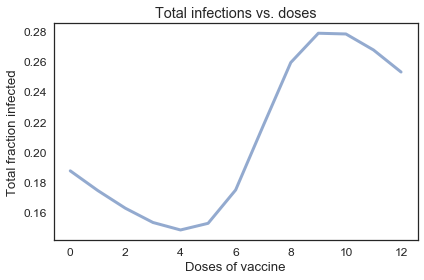

In [52]:
plot(infected_sweep)

decorate(xlabel='Doses of vaccine',
         ylabel='Total fraction infected',
         title='Total infections vs. doses',
         legend=False)

savefig('figs/chap05-fig06.pdf')

### Exercises

**Exercise:** Suppose the price of the vaccine drops to $50 per dose.  How does that affect the optimal allocation of the spending?

**Exercise:** Suppose we have the option to quarantine infected students.  For example, a student who feels ill might be moved to an infirmary, or a private dorm room, until they are no longer infectious.

How might you incorporate the effect of quarantine in the SIR model?

In [36]:
# Solution goes here